##### First I've uploaded all the required basic libraries for data manipulation,numeric and static libraries like pandas,numpy,scipy and data visulaization tool like seaborn and matplotlib

In [141]:
import numpy as np
import pandas as pd
import scipy.stats
from scipy.stats import zscore,boxcox
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [143]:
df=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv')
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


##### Now,I've uploaded the CSV file of Rainfall Prediction - Weather Forecasting Case and made a dataframe for the same.

##### In this dataset I've to Predict the 'how much rainfall could be there' and 'whether or not it will rain tomorrow both. Since 'rainfall' is in the form of continuous number hence will use Regression model and 'rain tomorrow' is in the form of categorical String format so will use classification model as well.Ergo, first will build a regression model to predict the 'rainfall'  and later in this notebook itself will build a classification model to predict 'whether or not it will rain tomorrow ' as well.

### A): Regression Model Building
### Exploratory Data Analysis(EDA)

In [144]:
print('Row"s are',df.shape[0])
print('Columns are',df.shape[1])
print('Shape is',df.shape)

Row"s are 8425
Columns are 23
Shape is (8425, 23)


In [4]:
#two dimensional dataframe
df.ndim

2

In [5]:
#Total datapoints in this dataframe
df.size

193775

In [6]:
#indexes are-
df.index

RangeIndex(start=0, stop=8425, step=1)

In [7]:
#columns of the dataframes are-
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [145]:
#numeric Dataframe
df_numeric=df.select_dtypes(exclude='object')
df_numeric

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8
1,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3
2,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2
3,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5
4,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.4,0.0,NaN,NaN,31.0,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4
8421,3.6,25.3,0.0,NaN,NaN,22.0,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5
8422,5.4,26.9,0.0,NaN,NaN,37.0,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1
8423,7.8,27.0,0.0,NaN,NaN,28.0,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0


In [146]:
#categorical Dataframe
df_categorical=df.select_dtypes(include='object')
df_categorical

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,W,W,WNW,No,No
1,2008-12-02,Albury,WNW,NNW,WSW,No,No
2,2008-12-03,Albury,WSW,W,WSW,No,No
3,2008-12-04,Albury,NE,SE,E,No,No
4,2008-12-05,Albury,W,ENE,NW,No,No
...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,E,SE,ENE,No,No
8421,2017-06-22,Uluru,NNW,SE,N,No,No
8422,2017-06-23,Uluru,N,SE,WNW,No,No
8423,2017-06-24,Uluru,SE,SSE,N,No,No


In [147]:
from sklearn.compose import make_column_selector as selector

In [148]:
numeric_columns=selector(dtype_exclude=object)(df)
print(numeric_columns)
print('\n Total numeric columns are ',len(numeric_columns))

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']

 Total numeric columns are  16


In [149]:
categorical_columns=selector(dtype_include=object)(df)
print(categorical_columns)
print('\n Total string categorical columns are ',len(categorical_columns))

['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']

 Total string categorical columns are  7


In [13]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [15]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [16]:
df.isnull().sum().sum()

19472

##### Null values are present in almost each columns and the null value counts as 19472,which is on higher side hence will replace it with mean or mode depending on the characteristics of the columns.

In [17]:
df.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

### Data Visualization
### 1.countplot

The Value Counts for the attribute "Location" is
 Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64

The Countplot Diagram for the attribute "Location" is
 AxesSubplot(0.125,0.125;0.775x0.755)


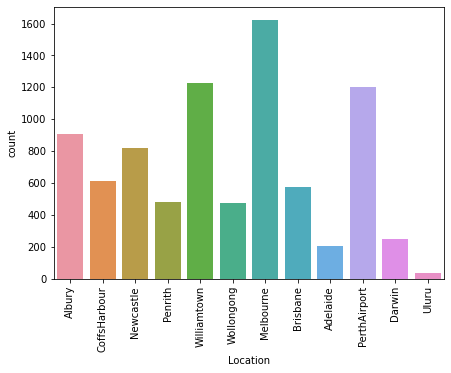



The Value Counts for the attribute "WindGustDir" is
 N      713
SSE    578
S      577
SW     572
E      557
WNW    531
W      507
WSW    504
SE     484
ENE    415
SSW    396
NW     383
NE     353
NNE    343
ESE    302
NNW    219
Name: WindGustDir, dtype: int64

The Countplot Diagram for the attribute "WindGustDir" is
 AxesSubplot(0.125,0.125;0.775x0.755)


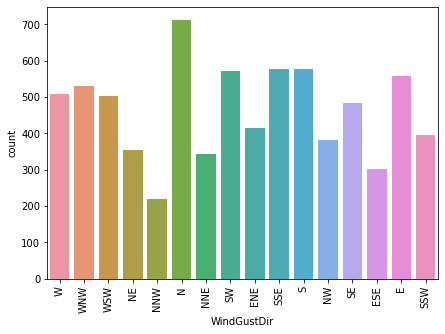



The Value Counts for the attribute "WindGustSpeed" is
 39.0     441
35.0     435
37.0     422
33.0     408
31.0     396
41.0     371
30.0     367
28.0     332
43.0     302
48.0     292
26.0     275
50.0     259
46.0     258
24.0     255
52.0     249
44.0     241
22.0     223
54.0     210
20.0     186
56.0     153
57.0     148
19.0     137
61.0     114
59.0     113
63.0      95
17.0      92
65.0      74
67.0      64
72.0      62
15.0      58
13.0      57
74.0      54
70.0      53
69.0      49
76.0      44
78.0      23
80.0      22
11.0      18
85.0      14
81.0      13
91.0      12
93.0       7
89.0       7
83.0       6
9.0        6
98.0       4
94.0       3
87.0       3
7.0        2
102.0      2
100.0      2
107.0      1
Name: WindGustSpeed, dtype: int64

The Countplot Diagram for the attribute "WindGustSpeed" is
 AxesSubplot(0.125,0.125;0.775x0.755)


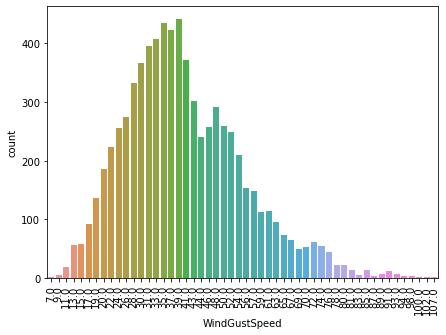



The Value Counts for the attribute "WindDir9am" is
 N      906
SW     704
NW     625
WSW    543
SE     505
WNW    480
SSW    467
ENE    433
NNE    430
W      414
NE     409
S      402
E      380
SSE    365
NNW    280
ESE    253
Name: WindDir9am, dtype: int64

The Countplot Diagram for the attribute "WindDir9am" is
 AxesSubplot(0.125,0.125;0.775x0.755)


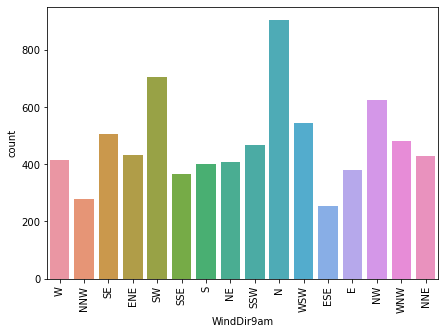



The Value Counts for the attribute "WindDir3pm" is
 SE     813
S      742
SSE    623
WSW    580
NE     544
N      524
SW     494
WNW    487
NW     468
W      462
ESE    462
E      460
ENE    417
SSW    370
NNE    365
NNW    306
Name: WindDir3pm, dtype: int64

The Countplot Diagram for the attribute "WindDir3pm" is
 AxesSubplot(0.125,0.125;0.775x0.755)


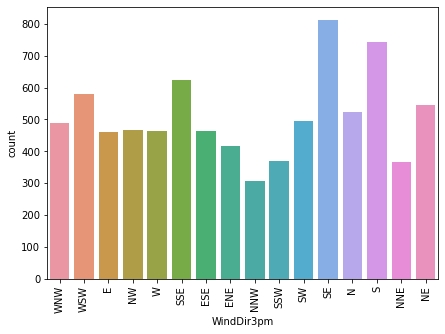



The Value Counts for the attribute "WindSpeed9am" is
 9.0     803
0.0     752
13.0    708
4.0     610
11.0    607
7.0     572
6.0     515
17.0    481
15.0    467
19.0    430
20.0    427
24.0    312
22.0    279
2.0     258
28.0    229
26.0    208
31.0    153
30.0    114
35.0     77
33.0     70
37.0     58
41.0     49
39.0     35
44.0     29
43.0     28
46.0     26
52.0     16
50.0     10
56.0      8
54.0      6
48.0      6
61.0      2
57.0      2
63.0      2
Name: WindSpeed9am, dtype: int64

The Countplot Diagram for the attribute "WindSpeed9am" is
 AxesSubplot(0.125,0.125;0.775x0.755)


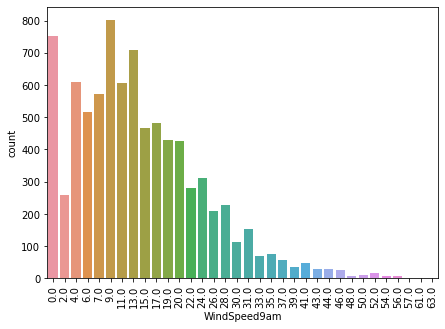



The Value Counts for the attribute "WindSpeed3pm" is
 9.0     724
19.0    639
13.0    599
20.0    594
17.0    555
11.0    534
15.0    524
24.0    511
28.0    458
22.0    457
26.0    378
7.0     331
4.0     287
30.0    279
31.0    266
6.0     240
0.0     199
33.0    170
35.0    137
37.0    125
39.0     80
2.0      58
41.0     45
43.0     34
46.0     29
44.0     18
50.0     12
48.0     11
52.0      9
56.0      7
54.0      2
61.0      2
57.0      2
65.0      1
83.0      1
Name: WindSpeed3pm, dtype: int64

The Countplot Diagram for the attribute "WindSpeed3pm" is
 AxesSubplot(0.125,0.125;0.775x0.755)


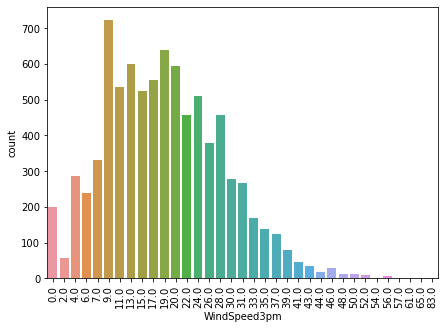



The Value Counts for the attribute "Humidity9am" is
 73.0    205
62.0    202
68.0    199
74.0    195
70.0    188
       ... 
17.0      2
14.0      2
11.0      2
10.0      1
15.0      1
Name: Humidity9am, Length: 90, dtype: int64

The Countplot Diagram for the attribute "Humidity9am" is
 AxesSubplot(0.125,0.125;0.775x0.755)


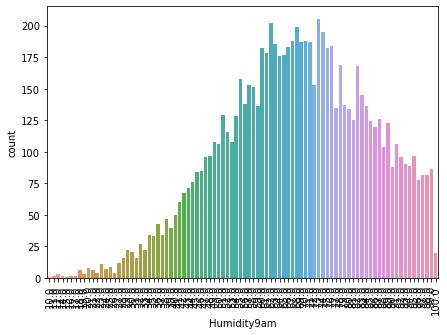



The Value Counts for the attribute "Humidity3pm" is
 55.0    195
48.0    194
51.0    194
46.0    193
54.0    193
       ... 
8.0      11
7.0       9
98.0      7
99.0      3
6.0       3
Name: Humidity3pm, Length: 94, dtype: int64

The Countplot Diagram for the attribute "Humidity3pm" is
 AxesSubplot(0.125,0.125;0.775x0.755)


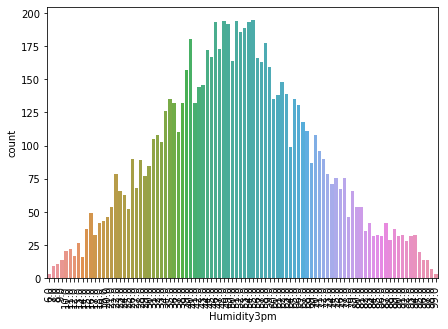



The Value Counts for the attribute "Cloud9am" is
 7.0    1418
1.0    1038
8.0    1015
0.0     554
6.0     551
5.0     414
3.0     384
2.0     357
4.0     273
Name: Cloud9am, dtype: int64

The Countplot Diagram for the attribute "Cloud9am" is
 AxesSubplot(0.125,0.125;0.775x0.755)


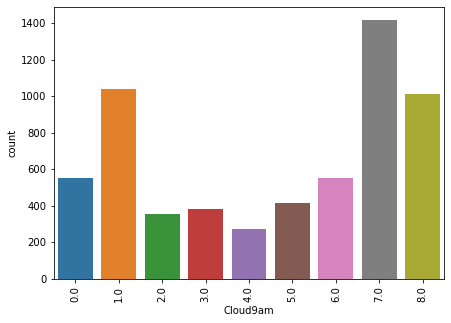



The Value Counts for the attribute "Cloud3pm" is
 7.0    1294
1.0    1077
8.0     863
6.0     597
5.0     522
2.0     508
3.0     411
4.0     351
0.0     347
Name: Cloud3pm, dtype: int64

The Countplot Diagram for the attribute "Cloud3pm" is
 AxesSubplot(0.125,0.125;0.775x0.755)


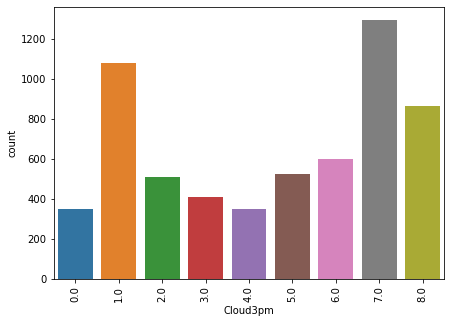



The Value Counts for the attribute "RainToday" is
 No     6195
Yes    1990
Name: RainToday, dtype: int64

The Countplot Diagram for the attribute "RainToday" is
 AxesSubplot(0.125,0.125;0.775x0.755)


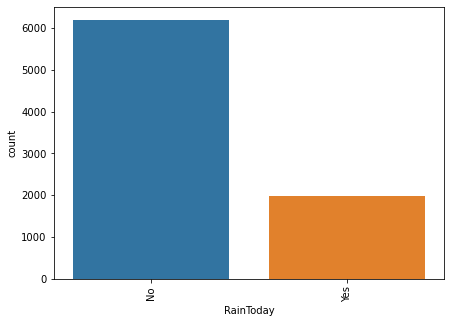



The Value Counts for the attribute "RainTomorrow" is
 No     6195
Yes    1991
Name: RainTomorrow, dtype: int64

The Countplot Diagram for the attribute "RainTomorrow" is
 AxesSubplot(0.125,0.125;0.775x0.755)


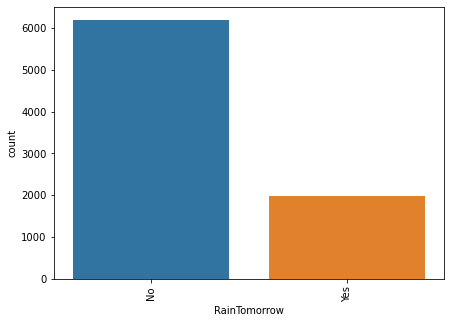

In [19]:
for i in df.columns.drop(['Date','MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','Pressure9am','Pressure3pm','Temp9am','Temp3pm']):
    print(f'The Value Counts for the attribute "{i}" is\n {df[i].value_counts()}')
    plt.figure(figsize=(7,5))
    print(f'\nThe Countplot Diagram for the attribute "{i}" is\n {sns.countplot(df[i])}')
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

### 2.Histplot


The Histogram Diagram for the attribute "Location" is
 AxesSubplot(0.125,0.125;0.775x0.755)


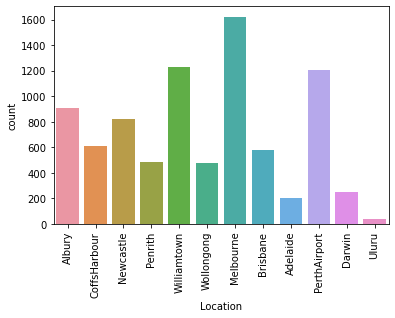




The Histogram Diagram for the attribute "WindGustDir" is
 AxesSubplot(0.125,0.125;0.775x0.755)


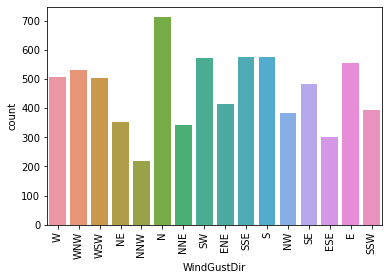




The Histogram Diagram for the attribute "WindGustSpeed" is
 AxesSubplot(0.125,0.125;0.775x0.755)


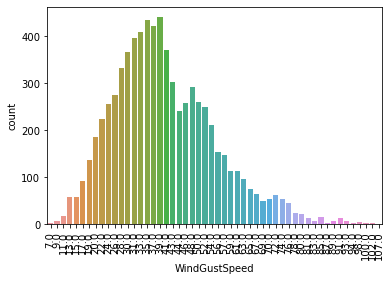




The Histogram Diagram for the attribute "WindDir9am" is
 AxesSubplot(0.125,0.125;0.775x0.755)


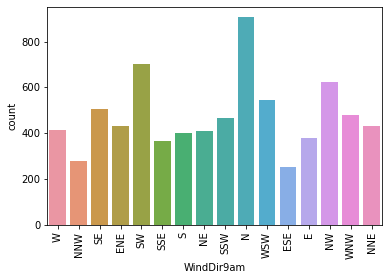




The Histogram Diagram for the attribute "WindDir3pm" is
 AxesSubplot(0.125,0.125;0.775x0.755)


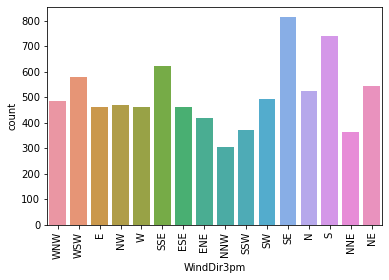




The Histogram Diagram for the attribute "WindSpeed9am" is
 AxesSubplot(0.125,0.125;0.775x0.755)


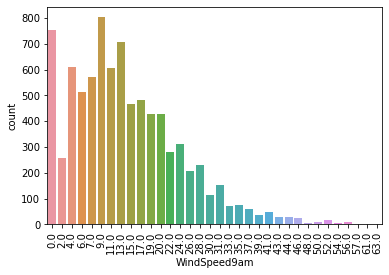




The Histogram Diagram for the attribute "WindSpeed3pm" is
 AxesSubplot(0.125,0.125;0.775x0.755)


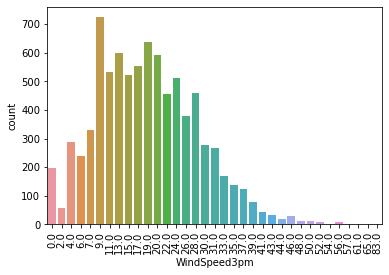




The Histogram Diagram for the attribute "Humidity9am" is
 AxesSubplot(0.125,0.125;0.775x0.755)


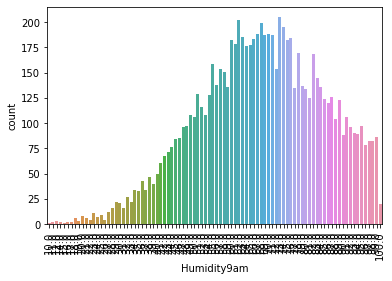




The Histogram Diagram for the attribute "Humidity3pm" is
 AxesSubplot(0.125,0.125;0.775x0.755)


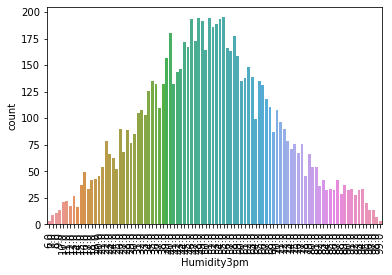




The Histogram Diagram for the attribute "Cloud9am" is
 AxesSubplot(0.125,0.125;0.775x0.755)


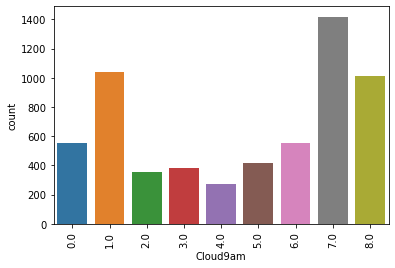




The Histogram Diagram for the attribute "Cloud3pm" is
 AxesSubplot(0.125,0.125;0.775x0.755)


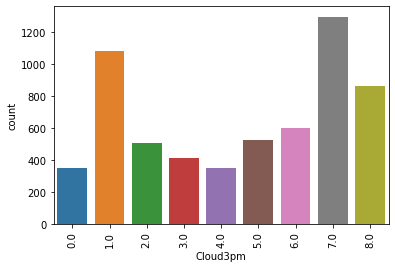




The Histogram Diagram for the attribute "RainToday" is
 AxesSubplot(0.125,0.125;0.775x0.755)


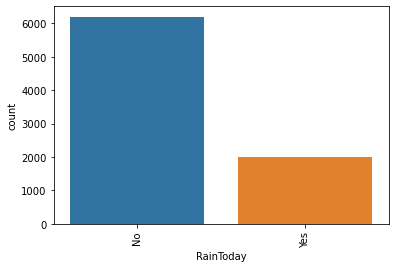




The Histogram Diagram for the attribute "RainTomorrow" is
 AxesSubplot(0.125,0.125;0.775x0.755)


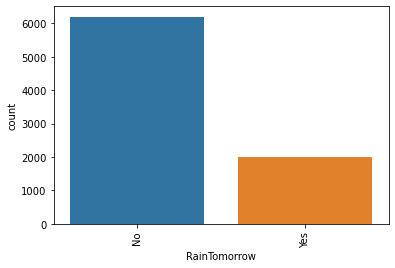

In [21]:
for i in df.columns.drop(['Date','MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','Pressure9am','Pressure3pm','Temp9am','Temp3pm']):
    print(f'\nThe Histogram Diagram for the attribute "{i}" is\n {sns.countplot(df[i])}')
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

### 3.Scatterplot (x-axis=Rainfall)

The Scatter Plot for the attribute "Rainfall" & "Location" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


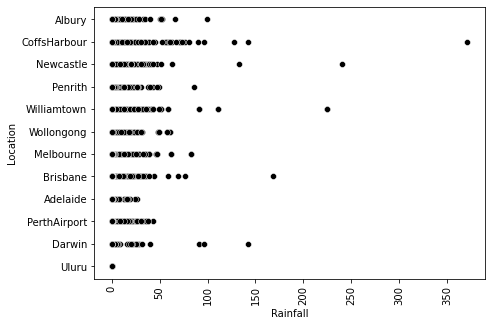



The Scatter Plot for the attribute "Rainfall" & "WindGustDir" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


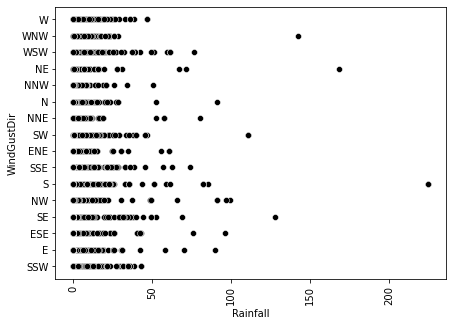



The Scatter Plot for the attribute "Rainfall" & "WindGustSpeed" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


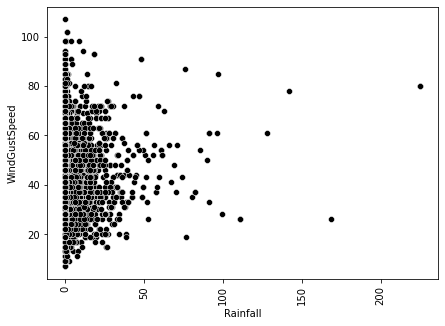



The Scatter Plot for the attribute "Rainfall" & "WindDir9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


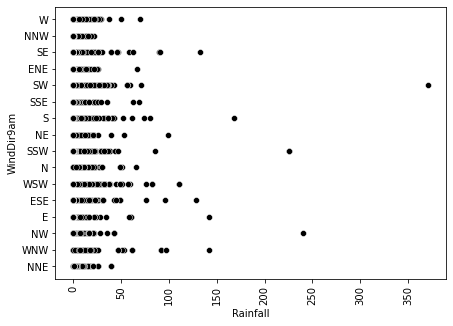



The Scatter Plot for the attribute "Rainfall" & "WindDir3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


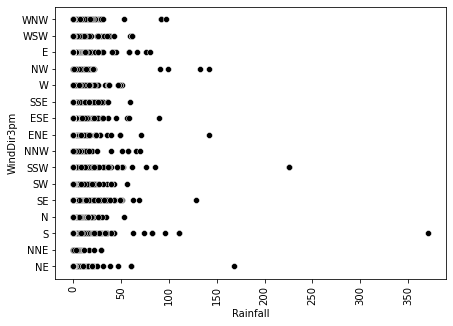



The Scatter Plot for the attribute "Rainfall" & "WindSpeed9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


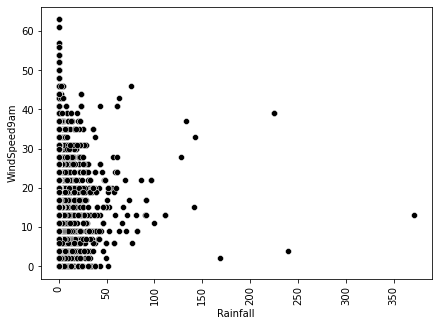



The Scatter Plot for the attribute "Rainfall" & "WindSpeed3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


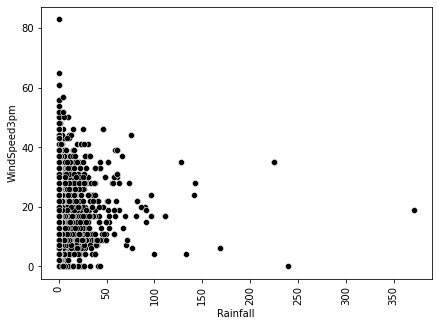



The Scatter Plot for the attribute "Rainfall" & "Humidity9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


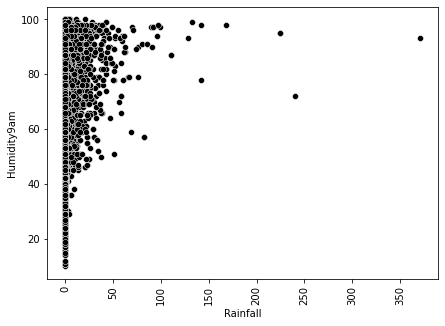



The Scatter Plot for the attribute "Rainfall" & "Humidity3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


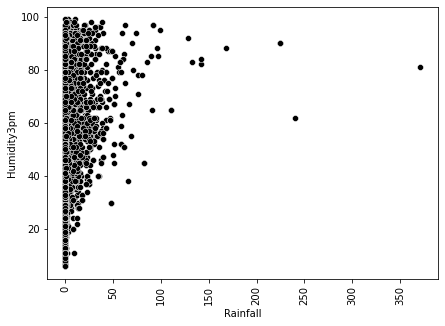



The Scatter Plot for the attribute "Rainfall" & "Cloud9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


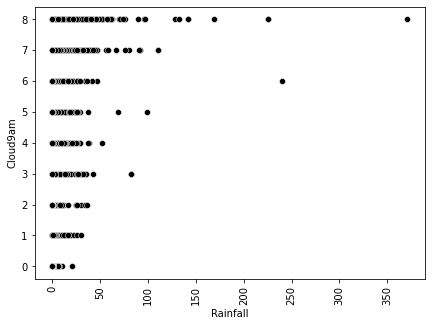



The Scatter Plot for the attribute "Rainfall" & "Cloud3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


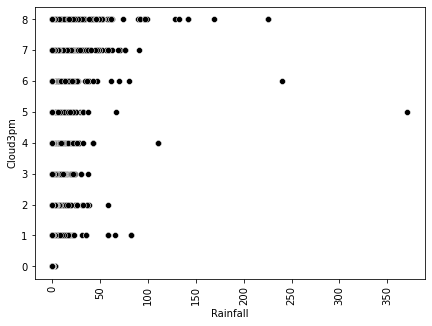



The Scatter Plot for the attribute "Rainfall" & "RainToday" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


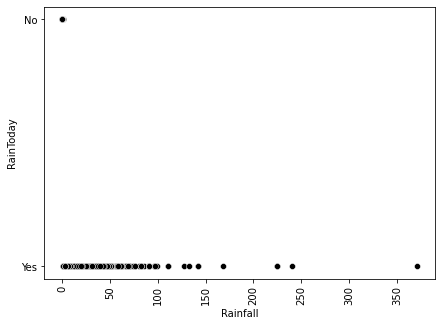



The Scatter Plot for the attribute "Rainfall" & "RainTomorrow" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


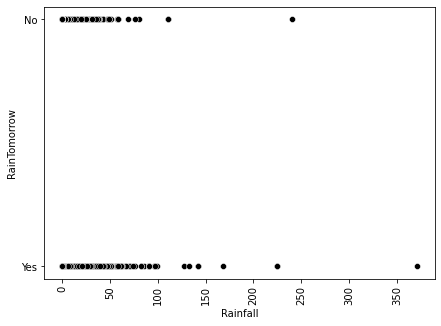

In [23]:
for i in df.columns.drop(['Date','MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','Pressure9am','Pressure3pm','Temp9am','Temp3pm']):
    plt.figure(figsize=(7,5))
    print(f'The Scatter Plot for the attribute "Rainfall" & "{i}" is-\n {sns.scatterplot(df["Rainfall"],df[i],color="black")}')
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

### 4.Scatterplot (x-axis=RainTomorrow)

The Scatter Plot for the attribute "RainTomorrow" & "Location" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


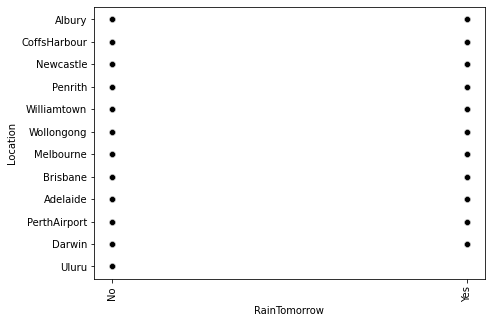



The Scatter Plot for the attribute "RainTomorrow" & "WindGustDir" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


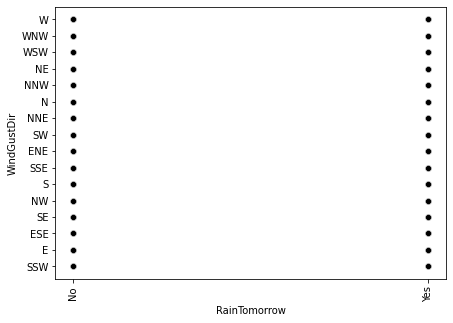



The Scatter Plot for the attribute "RainTomorrow" & "WindGustSpeed" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


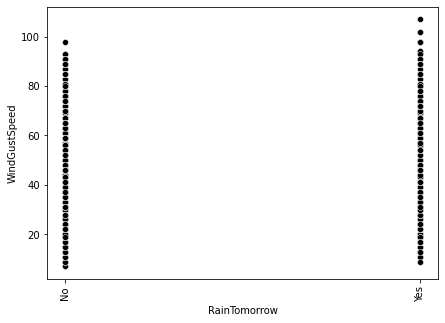



The Scatter Plot for the attribute "RainTomorrow" & "WindDir9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


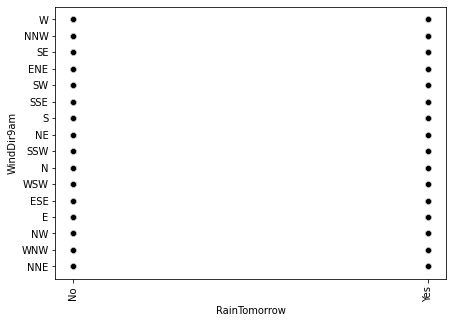



The Scatter Plot for the attribute "RainTomorrow" & "WindDir3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


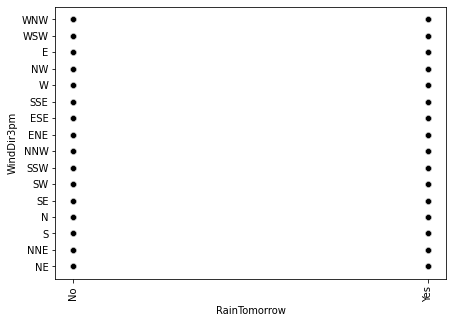



The Scatter Plot for the attribute "RainTomorrow" & "WindSpeed9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


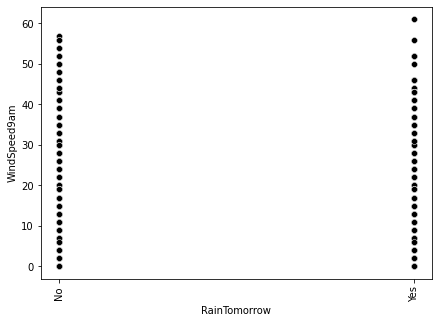



The Scatter Plot for the attribute "RainTomorrow" & "WindSpeed3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


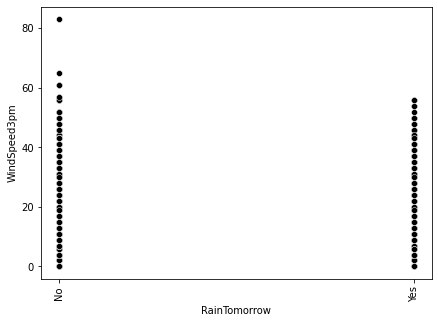



The Scatter Plot for the attribute "RainTomorrow" & "Humidity9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


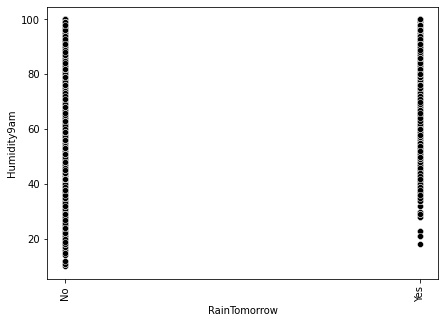



The Scatter Plot for the attribute "RainTomorrow" & "Humidity3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


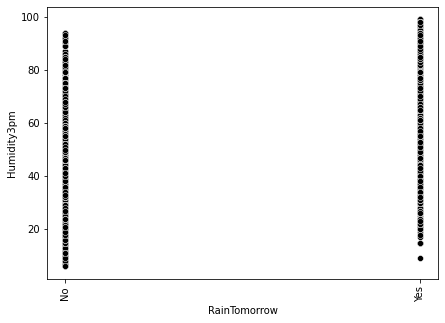



The Scatter Plot for the attribute "RainTomorrow" & "Cloud9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


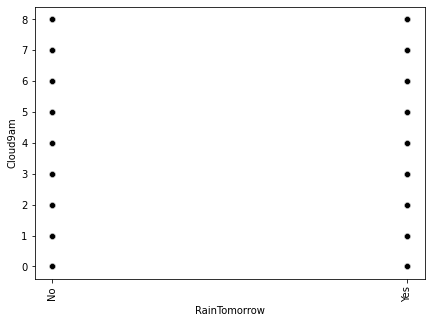



The Scatter Plot for the attribute "RainTomorrow" & "Cloud3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


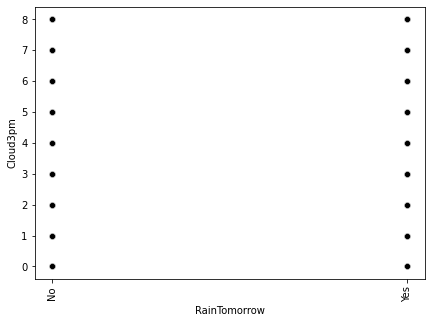



The Scatter Plot for the attribute "RainTomorrow" & "RainToday" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


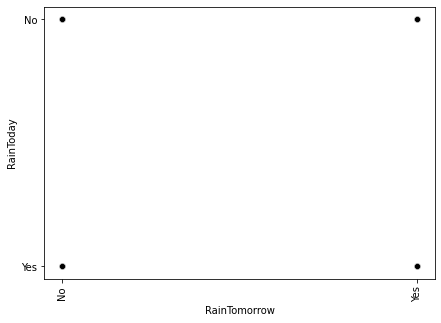



The Scatter Plot for the attribute "RainTomorrow" & "RainTomorrow" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


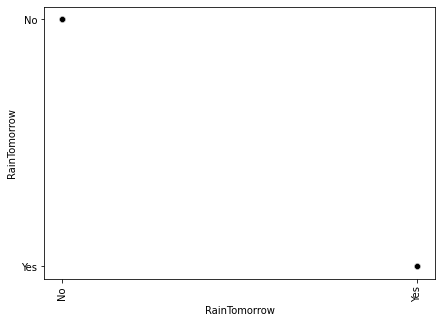

In [150]:
for i in df.columns.drop(['Date','MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','Pressure9am','Pressure3pm','Temp9am','Temp3pm']):
    plt.figure(figsize=(7,5))
    print(f'The Scatter Plot for the attribute "RainTomorrow" & "{i}" is-\n {sns.scatterplot(df["RainTomorrow"],df[i],color="black")}')
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

### 5.LinePlot(x-axis=Rainfall)

The Line Plot for the attribute "Rainfall" & "Location" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


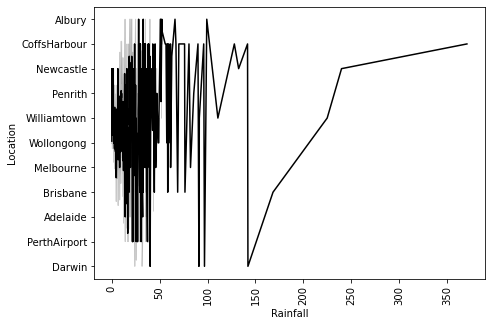



The Line Plot for the attribute "Rainfall" & "WindGustDir" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


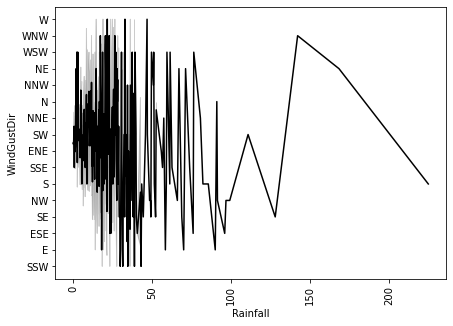



The Line Plot for the attribute "Rainfall" & "WindGustSpeed" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


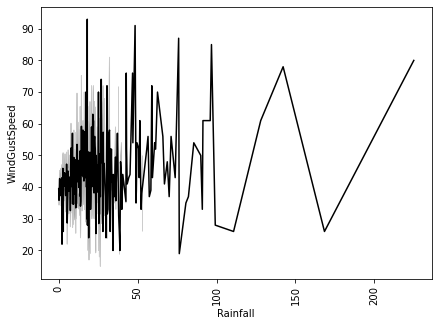



The Line Plot for the attribute "Rainfall" & "WindDir9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


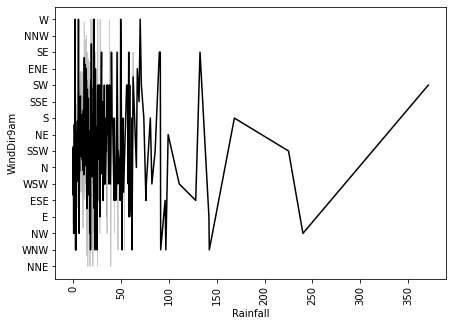



The Line Plot for the attribute "Rainfall" & "WindDir3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


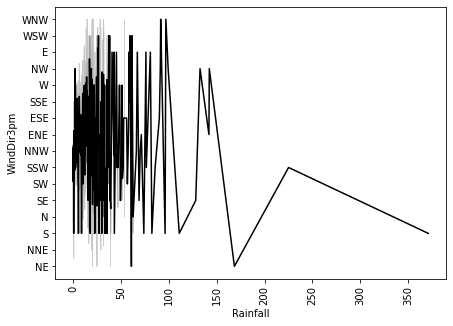



The Line Plot for the attribute "Rainfall" & "WindSpeed9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


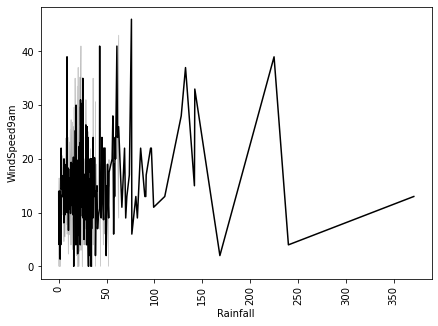



The Line Plot for the attribute "Rainfall" & "WindSpeed3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


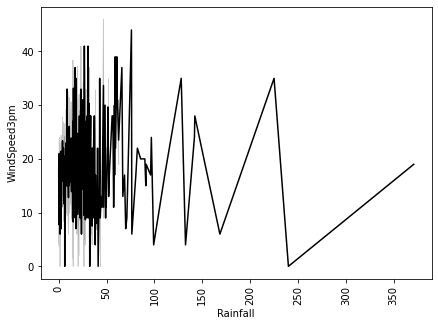



The Line Plot for the attribute "Rainfall" & "Humidity9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


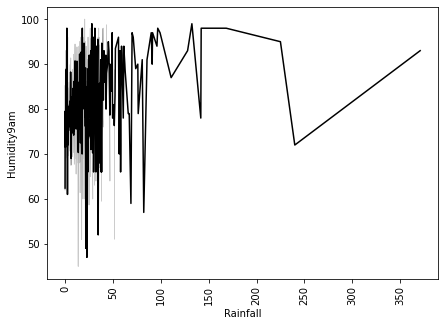



The Line Plot for the attribute "Rainfall" & "Humidity3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


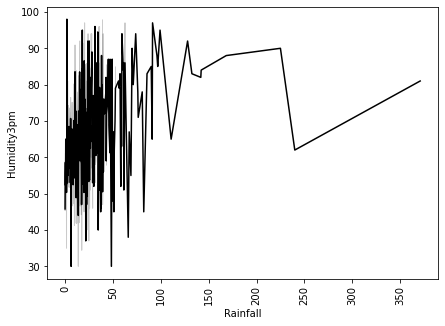



The Line Plot for the attribute "Rainfall" & "Cloud9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


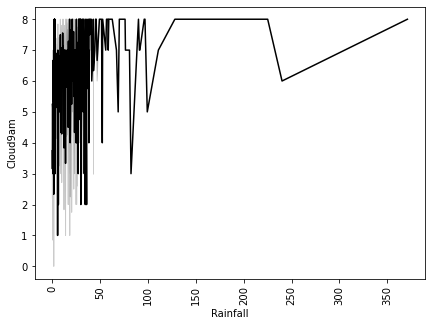



The Line Plot for the attribute "Rainfall" & "Cloud3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


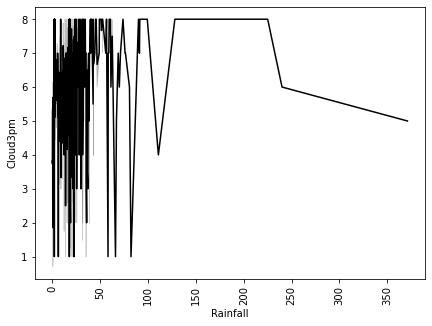



The Line Plot for the attribute "Rainfall" & "RainToday" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


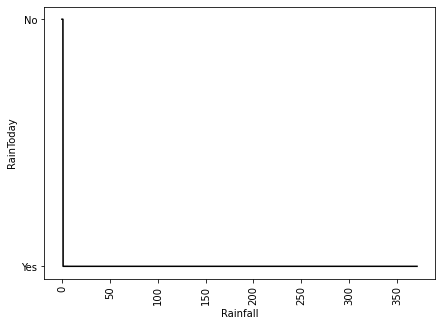



The Line Plot for the attribute "Rainfall" & "RainTomorrow" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


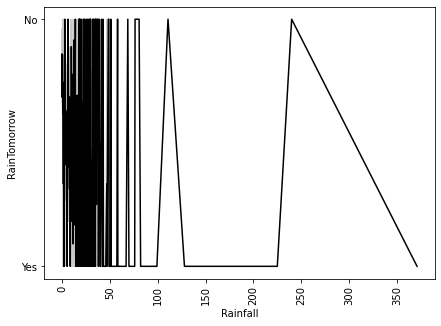

In [24]:
for i in df.columns.drop(['Date','MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','Pressure9am','Pressure3pm','Temp9am','Temp3pm']):
    plt.figure(figsize=(7,5))
    print(f'The Line Plot for the attribute "Rainfall" & "{i}" is-\n {sns.lineplot(df["Rainfall"],df[i],color="black")}')
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

### 6.Categorical Plot

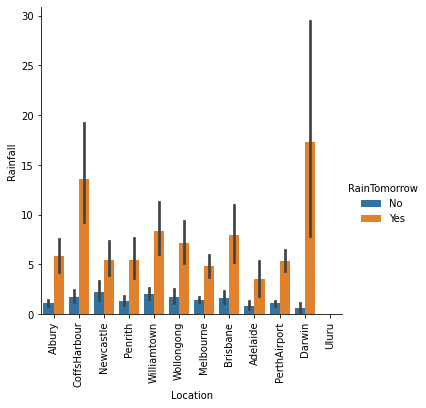

In [28]:
sns.catplot(x='Location',y='Rainfall',hue='RainTomorrow',data=df,kind='bar')
plt.xticks(rotation=90)
plt.show()

###### In Darwin Location their is possibillity of rain tomorrow of approx 20mm

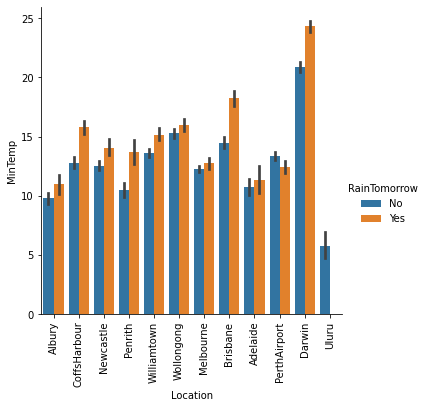

In [29]:
sns.catplot(x='Location',y='MinTemp',hue='RainTomorrow',data=df,kind='bar')
plt.xticks(rotation=90)
plt.show()

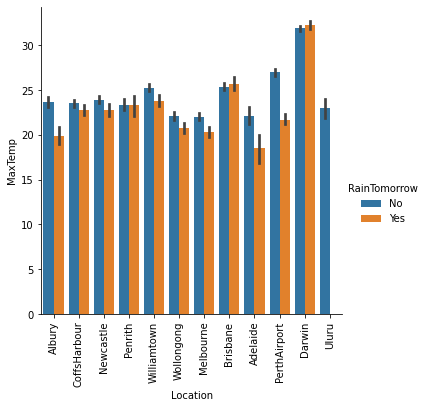

In [30]:
sns.catplot(x='Location',y='MaxTemp',hue='RainTomorrow',data=df,kind='bar')
plt.xticks(rotation=90)
plt.show()

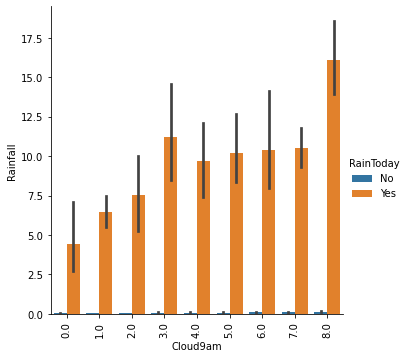

In [31]:
sns.catplot(x='Cloud9am',y='Rainfall',hue='RainToday',data=df,kind='bar')
plt.xticks(rotation=90)
plt.show()

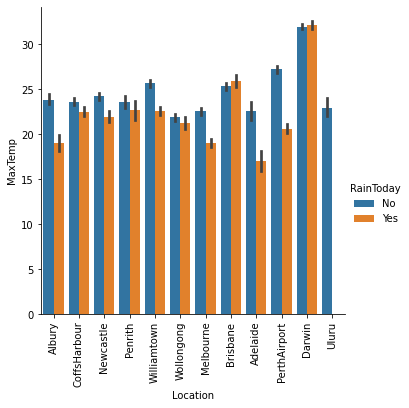

In [33]:
sns.catplot(x='Location',y='MaxTemp',hue='RainToday',data=df,kind='bar')
plt.xticks(rotation=90)
plt.show()

### SimpleImputer
##### To replace nan values of categorical and numeric columns w.r.t. mode and mean/median

In [151]:
from sklearn.impute import SimpleImputer

In [152]:
#replacing nan of numerical columns with mean
for i in numeric_columns:
    df[i]=SimpleImputer(missing_values=np.nan,strategy='mean').fit_transform(df[i].values.reshape(-1,1))

In [153]:
#replacing nan of categorical columns with mode
for i in categorical_columns:
    df[i]=SimpleImputer(missing_values=np.nan,strategy='most_frequent').fit_transform(df[i].values.reshape(-1,1))

In [154]:
df.isnull().sum().sum()

0

We've successfully replaced all the nan values present in the dataset.

### Encoding
##### Now I'll convert all the categorical columns into numeric one by applying label encoder technique
### Label Encoder

In [155]:
import sklearn
from sklearn.preprocessing import LabelEncoder

In [156]:
for j in categorical_columns:
    df[j]=LabelEncoder().fit_transform(df[j].astype(str))

In [157]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0,1,13.4,22.9,0.6,5.389395,7.632205,13,44.0,13,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0
1,1,1,7.4,25.1,0.0,5.389395,7.632205,14,44.0,6,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0
2,2,1,12.9,25.7,0.0,5.389395,7.632205,15,46.0,13,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0
3,3,1,9.2,28.0,0.0,5.389395,7.632205,4,24.0,9,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0
4,4,1,17.5,32.3,1.0,5.389395,7.632205,13,41.0,1,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0


In [57]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2999,9,2.8,23.400000,0.0,5.389395,7.632205,0,31.000000,9,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0,0
8421,3000,9,3.6,25.300000,0.0,5.389395,7.632205,6,22.000000,9,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0,0
8422,3001,9,5.4,26.900000,0.0,5.389395,7.632205,3,37.000000,9,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0,0
8423,3002,9,7.8,27.000000,0.0,5.389395,7.632205,9,28.000000,10,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0,0
8424,3003,9,14.9,23.859976,0.0,5.389395,7.632205,3,40.174469,2,...,62.0,36.0,1020.2,1017.9,8.000000,8.000000,15.0,20.9,0,0


In [58]:
df.sample()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6172,803,2,19.8,31.1,0.0,2.8,7.632205,0,22.0,13,...,61.0,51.0,1015.9,1012.7,3.0,1.0,27.1,30.0,0,0


### 8.ViolinPlot

The Violin-Plot for the attribute "Date" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


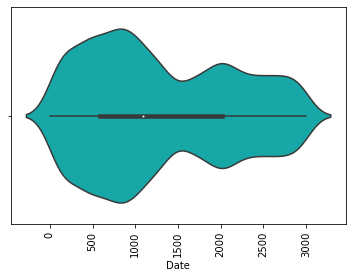



The Violin-Plot for the attribute "Location" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


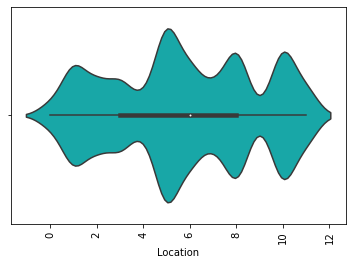



The Violin-Plot for the attribute "MinTemp" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


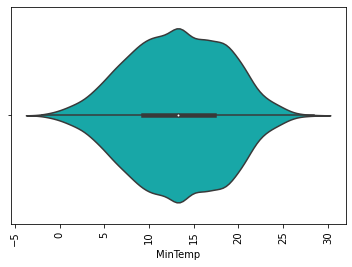



The Violin-Plot for the attribute "MaxTemp" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


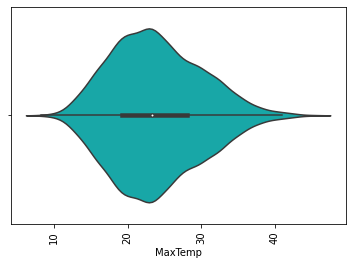



The Violin-Plot for the attribute "Rainfall" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


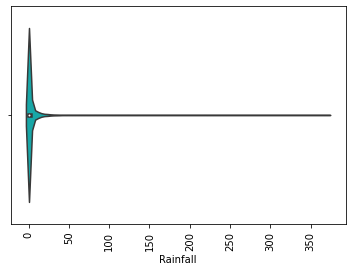



The Violin-Plot for the attribute "Evaporation" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


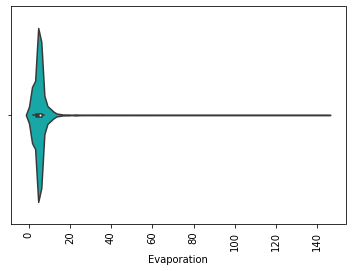



The Violin-Plot for the attribute "Sunshine" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


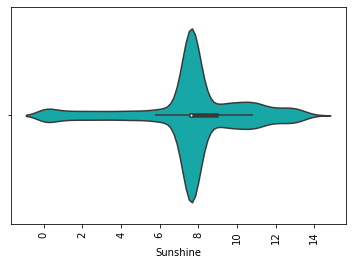



The Violin-Plot for the attribute "WindGustDir" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


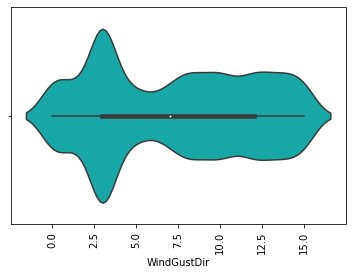



The Violin-Plot for the attribute "WindGustSpeed" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


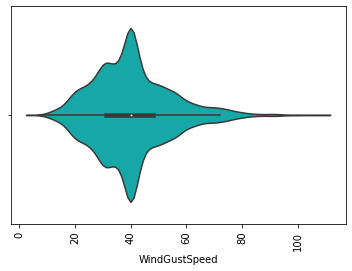



The Violin-Plot for the attribute "WindDir9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


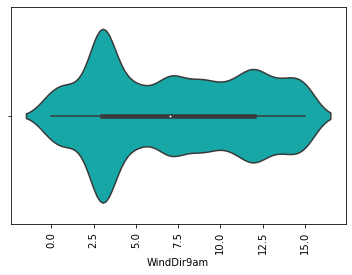



The Violin-Plot for the attribute "WindDir3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


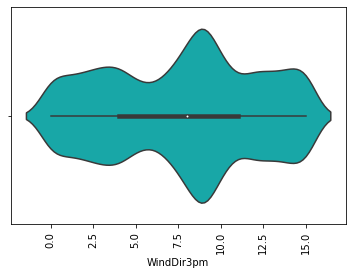



The Violin-Plot for the attribute "WindSpeed9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


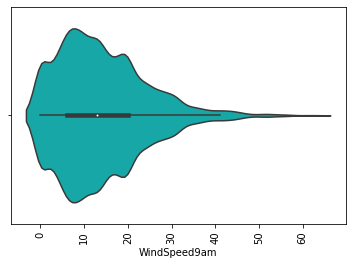



The Violin-Plot for the attribute "WindSpeed3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


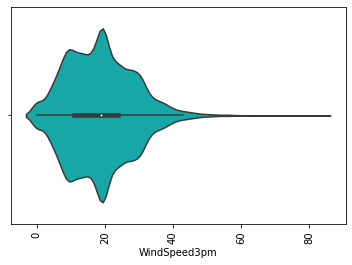



The Violin-Plot for the attribute "Humidity9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


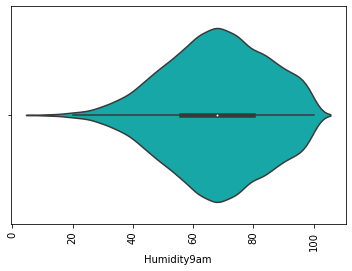



The Violin-Plot for the attribute "Humidity3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


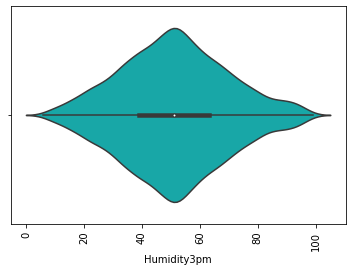



The Violin-Plot for the attribute "Pressure9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


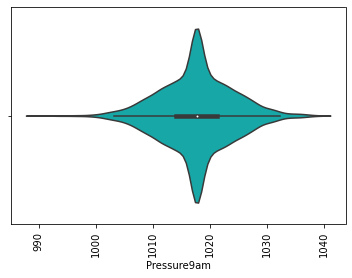



The Violin-Plot for the attribute "Pressure3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


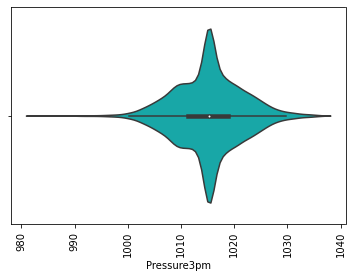



The Violin-Plot for the attribute "Cloud9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


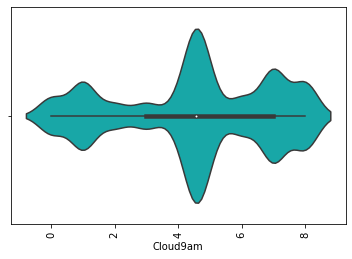



The Violin-Plot for the attribute "Cloud3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


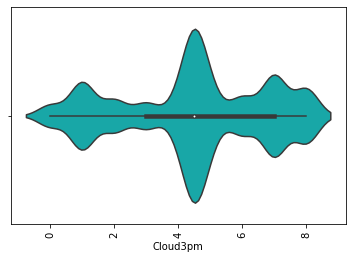



The Violin-Plot for the attribute "Temp9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


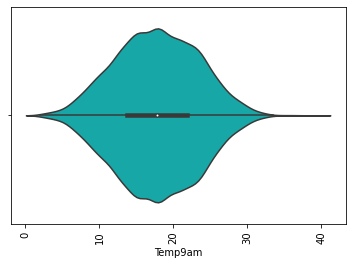



The Violin-Plot for the attribute "Temp3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


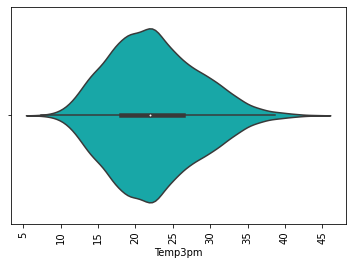



The Violin-Plot for the attribute "RainToday" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


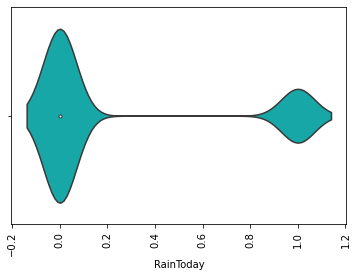



The Violin-Plot for the attribute "RainTomorrow" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


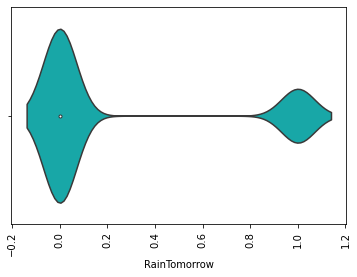

In [59]:
for i in df.columns:
    print(f'The Violin-Plot for the attribute "{i}" is-\n {sns.violinplot(df[i],color="c")}')
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

### 9.ViolinPlot

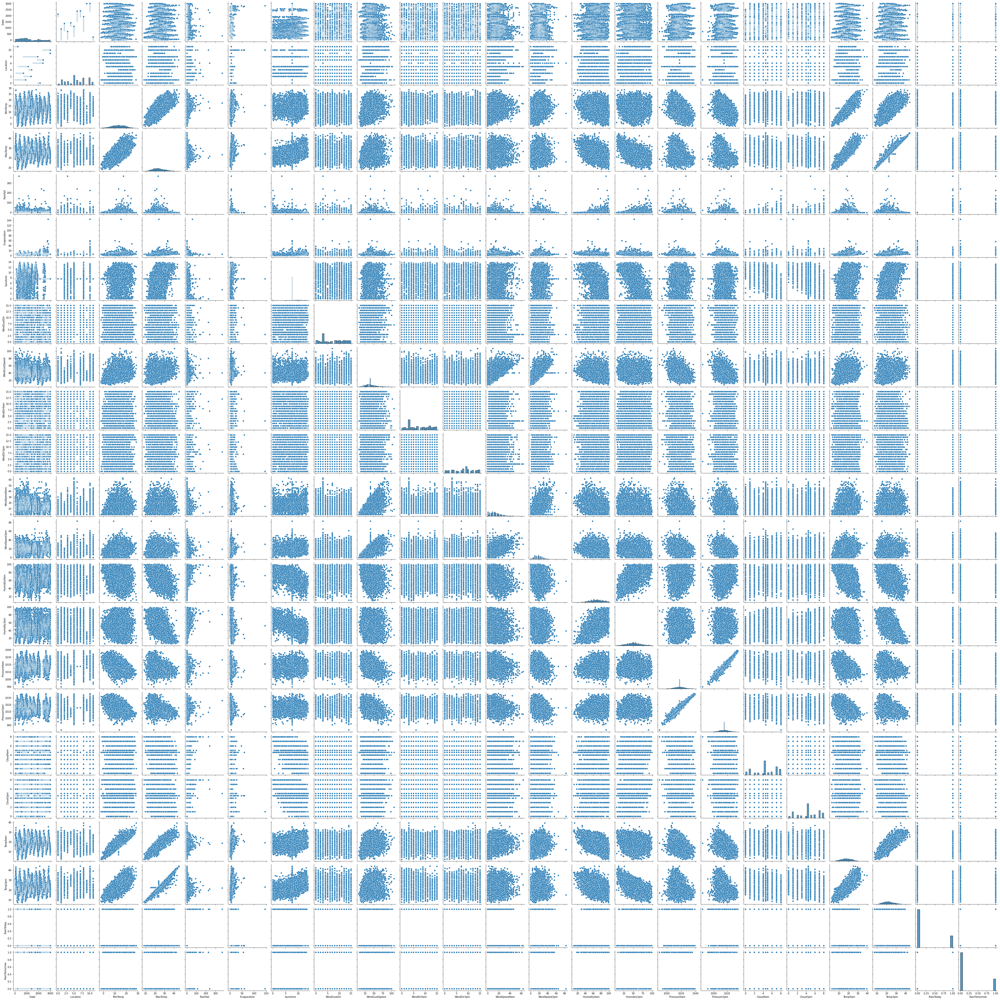

In [60]:
sns.pairplot(df)

### Descriptive Statistics

In [61]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Date,8425.0,1296.570564,854.249434,0.0,589.000000,1088.000000,2021.000000,3003.0
Location,8425.0,5.793591,3.162654,0.0,3.000000,6.000000,8.000000,11.0
MinTemp,8425.0,13.193305,5.379488,-2.0,9.300000,13.200000,17.300000,28.5
MaxTemp,8425.0,23.859976,6.114516,8.2,19.300000,23.300000,28.000000,45.5
Rainfall,8425.0,2.805913,10.309308,0.0,0.000000,0.000000,1.400000,371.0
Evaporation,8425.0,5.389395,3.852004,0.0,4.000000,5.389395,5.389395,145.0
Sunshine,8425.0,7.632205,2.825451,0.0,7.632205,7.632205,8.900000,13.9
WindGustDir,8425.0,7.217804,4.702616,0.0,3.000000,7.000000,12.000000,15.0
WindGustSpeed,8425.0,40.174469,13.776101,7.0,31.000000,40.174469,48.000000,107.0
WindDir9am,8425.0,7.267418,4.588045,0.0,3.000000,7.000000,12.000000,15.0


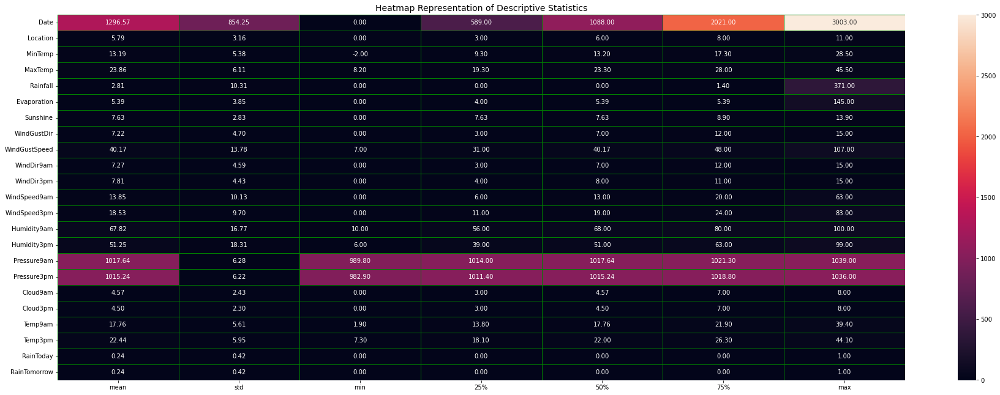

In [62]:
plt.figure(figsize=(31,11))
sns.heatmap(df.describe()[1:].transpose(),annot=True,linecolor='Green',linewidth='0.5',fmt='0.2f')
plt.title('Heatmap Representation of Descriptive Statistics',fontsize=14)
plt.show()

### Correlation

In [63]:
df.corr()['Rainfall'].sort_values()

Sunshine        -0.169432
Temp3pm         -0.090687
MaxTemp         -0.087451
Pressure9am     -0.072668
Pressure3pm     -0.033649
Temp9am         -0.007083
Date             0.004945
Location         0.007693
Evaporation      0.023517
WindSpeed3pm     0.024791
WindDir3pm       0.038560
WindGustDir      0.038812
WindSpeed9am     0.050631
WindGustSpeed    0.086000
MinTemp          0.087684
WindDir9am       0.093821
Cloud3pm         0.150760
Cloud9am         0.185444
RainTomorrow     0.220021
Humidity9am      0.228800
Humidity3pm      0.235444
RainToday        0.461106
Rainfall         1.000000
Name: Rainfall, dtype: float64

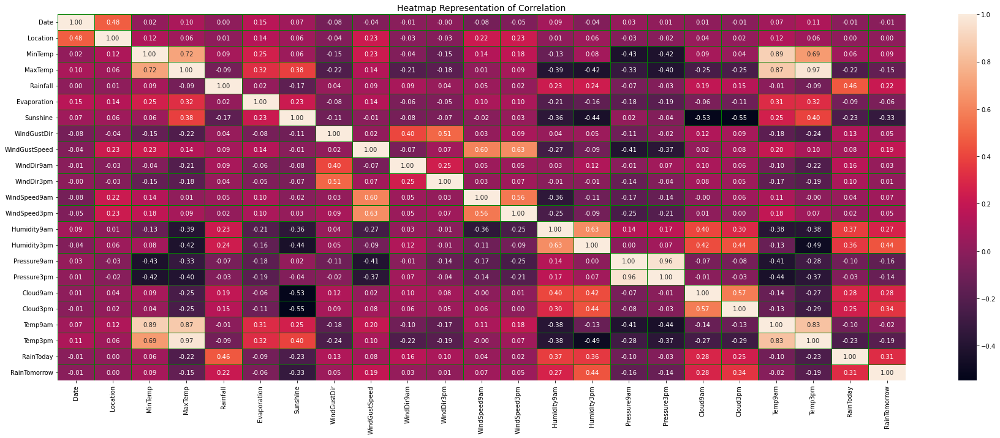

In [64]:
plt.figure(figsize=(31,11))
sns.heatmap(df.corr(),annot=True,linecolor='green',linewidth='1',fmt='0.2f')
plt.title('Heatmap Representation of Correlation',fontsize=14)
plt.show()

### Multicollinearity

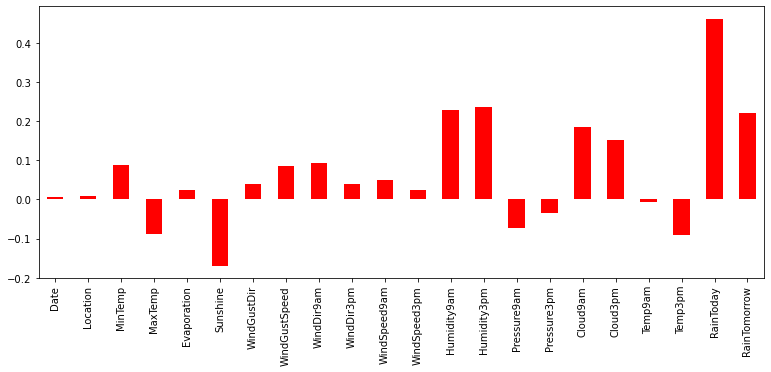

In [65]:
plt.figure(figsize=(13,5))
df.corr()['Rainfall'].drop(['Rainfall']).plot(kind='bar',color='r')
plt.show()

###### i'll check the multicollinearity later in the Data Cleansing portion when i'll be calculating the Variance inflation factor.
### Skewness

In [66]:
df.skew().sort_values()

Sunshine         -0.716525
Cloud9am         -0.366503
Cloud3pm         -0.276294
Humidity9am      -0.256743
WindDir3pm       -0.119847
MinTemp          -0.089989
Location         -0.050456
Pressure9am      -0.024082
Temp9am          -0.014748
Pressure3pm      -0.010214
Humidity3pm       0.118281
WindGustDir       0.119640
WindDir9am        0.172792
MaxTemp           0.380654
Date              0.386560
Temp3pm           0.397331
WindSpeed3pm      0.494217
WindGustSpeed     0.757000
WindSpeed9am      0.960591
RainTomorrow      1.241588
RainToday         1.242362
Rainfall         13.218403
Evaporation      14.023948
dtype: float64

### Distribution Plot
##### Here we can now check the normal distribution pattern for each of the attributes which are skewed left or right hand side

The Distribution Plot for attribute "Date" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


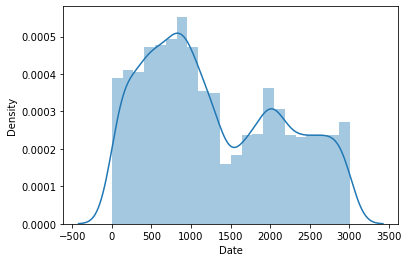



The Distribution Plot for attribute "Location" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


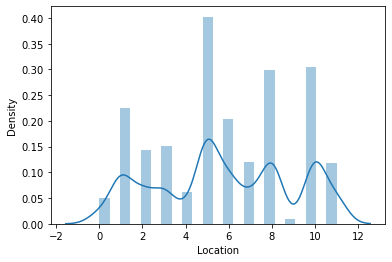



The Distribution Plot for attribute "MinTemp" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


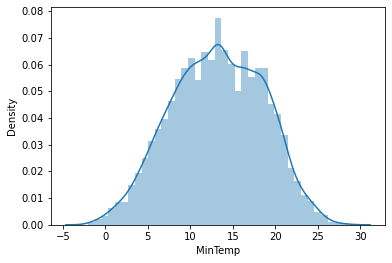



The Distribution Plot for attribute "MaxTemp" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


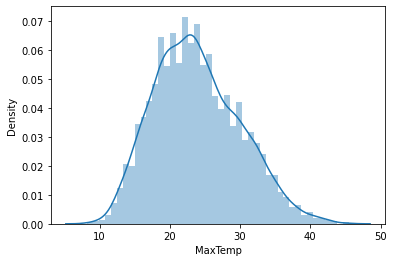



The Distribution Plot for attribute "Rainfall" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


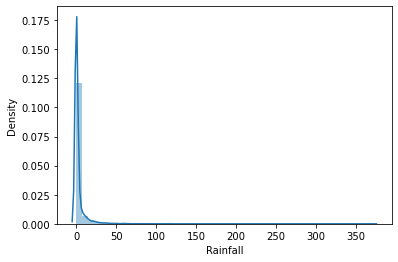



The Distribution Plot for attribute "Evaporation" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


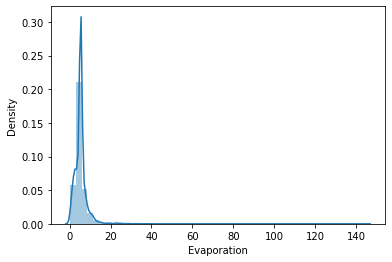



The Distribution Plot for attribute "Sunshine" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


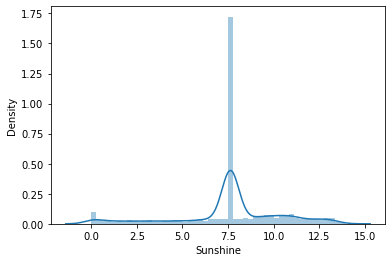



The Distribution Plot for attribute "WindGustDir" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


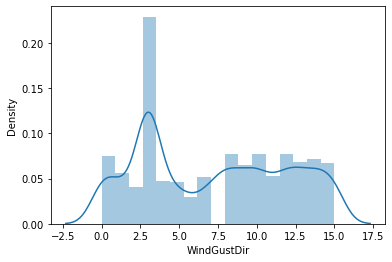



The Distribution Plot for attribute "WindGustSpeed" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


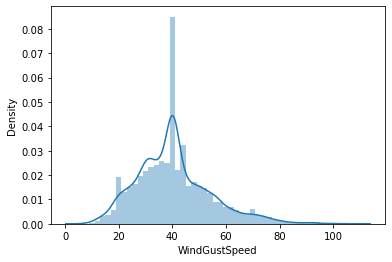



The Distribution Plot for attribute "WindDir9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


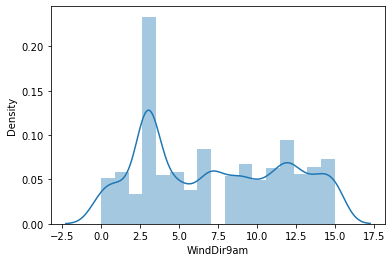



The Distribution Plot for attribute "WindDir3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


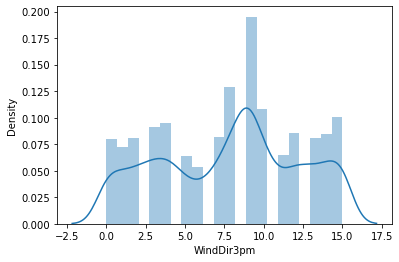



The Distribution Plot for attribute "WindSpeed9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


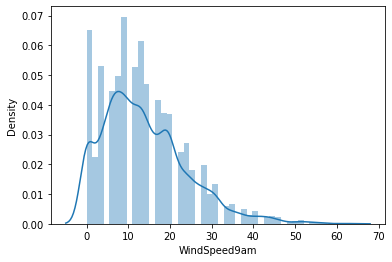



The Distribution Plot for attribute "WindSpeed3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


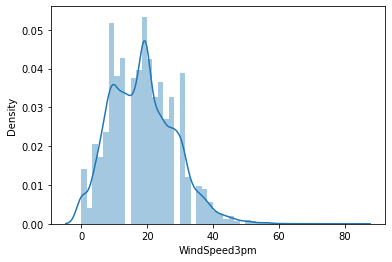



The Distribution Plot for attribute "Humidity9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


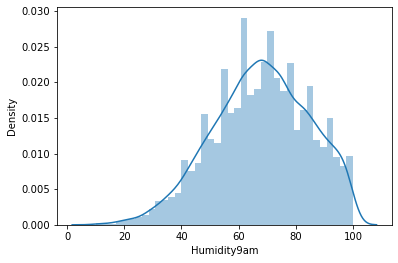



The Distribution Plot for attribute "Humidity3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


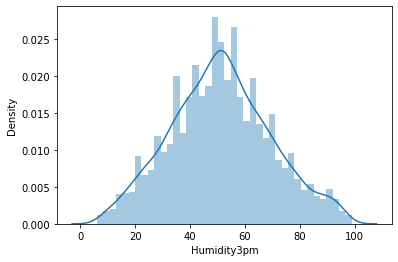



The Distribution Plot for attribute "Pressure9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


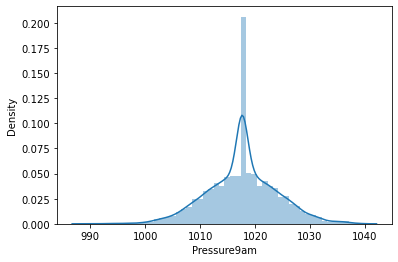



The Distribution Plot for attribute "Pressure3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


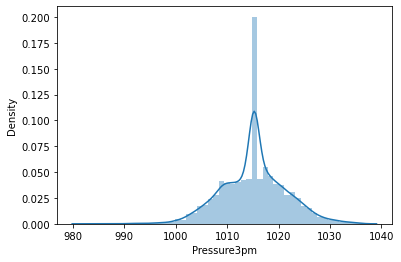



The Distribution Plot for attribute "Cloud9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


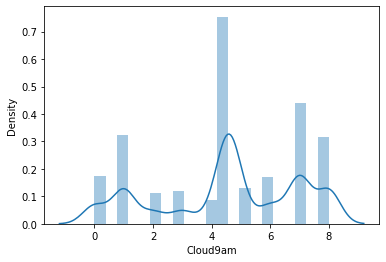



The Distribution Plot for attribute "Cloud3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


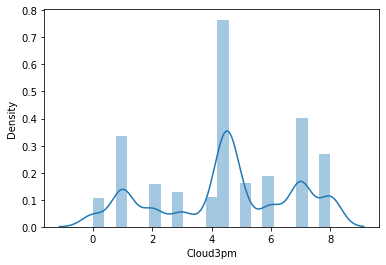



The Distribution Plot for attribute "Temp9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


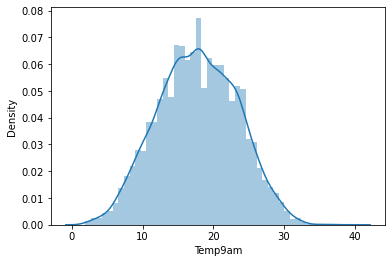



The Distribution Plot for attribute "Temp3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


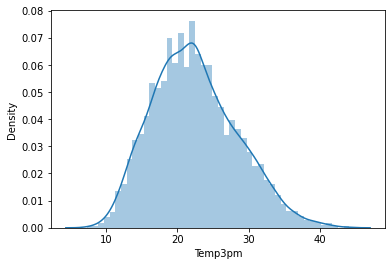



The Distribution Plot for attribute "RainToday" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


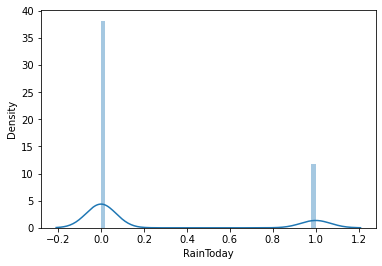



The Distribution Plot for attribute "RainTomorrow" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


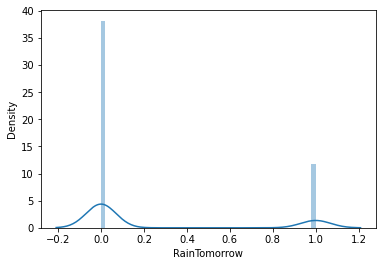

In [67]:
for i in df.columns:
    print(f'The Distribution Plot for attribute "{i}" is-\n {sns.distplot(df[i])}')
    plt.show()
    print('\n')

As we can see in the above distribution plots all of the attributes are skewed both right ad left hand side.Ergo,i'll remove the skewness later on the data cleansing section by power transfrorm or boxcox method

### Outliers

In [68]:
z=np.abs(zscore(df))
np.where(z>3)

(array([  12,   12,   44,   44,   52,   52,   60,   60,   61,   61,   62,
          62,   62,   67,   68,   68,  123,  267,  296,  381,  381,  405,
         406,  407,  407,  431,  462,  563,  568,  568,  569,  602,  683,
         683,  699,  713,  748,  748,  770,  796,  797,  802,  928,  935,
         949,  979,  980,  980,  980, 1008, 1009, 1011, 1138, 1148, 1149,
        1151, 1189, 1202, 1203, 1237, 1241, 1264, 1265, 1357, 1411, 1412,
        1413, 1479, 1480, 1481, 1513, 1535, 1587, 1644, 1661, 1665, 1673,
        1680, 1774, 1819, 1873, 1898, 1903, 1945, 2016, 2028, 2043, 2063,
        2074, 2108, 2116, 2186, 2201, 2219, 2219, 2230, 2231, 2265, 2429,
        2488, 2500, 2505, 2527, 2527, 2541, 2593, 2676, 2677, 2735, 2827,
        2835, 2849, 2849, 2855, 2859, 2863, 2869, 2877, 2883, 2890, 2891,
        2897, 2898, 2900, 2901, 2905, 2909, 2911, 2919, 2925, 2933, 2939,
        2947, 2953, 2961, 2967, 2975, 2989, 3003, 3051, 3051, 3058, 3059,
        3059, 3060, 3066, 3067, 3067, 

we can see that there are lots of rows and columns are present having outliers

In [70]:
print(z.iloc[12,15])
print(z.iloc[12,16])
print(z.iloc[44,3])

3.7193299828367716
3.5766094945083426
3.130445857854079


### Boxplots To check the Outliers

The Box-Plot for attribute "Date" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


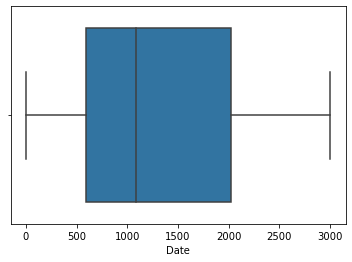



The Box-Plot for attribute "Location" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


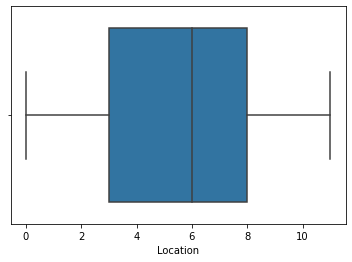



The Box-Plot for attribute "MinTemp" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


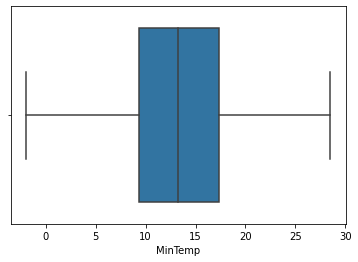



The Box-Plot for attribute "MaxTemp" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


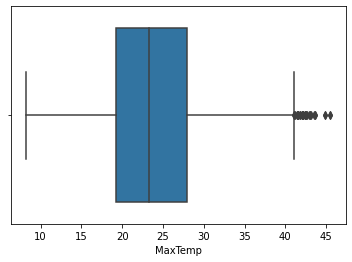



The Box-Plot for attribute "Rainfall" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


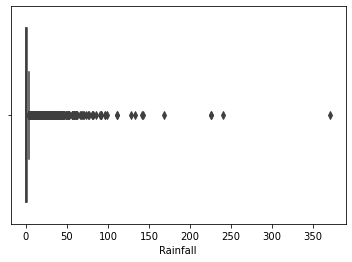



The Box-Plot for attribute "Evaporation" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


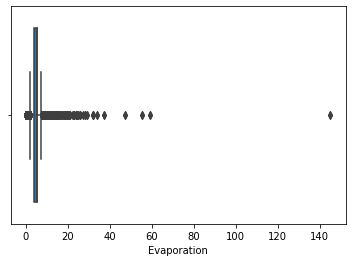



The Box-Plot for attribute "Sunshine" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


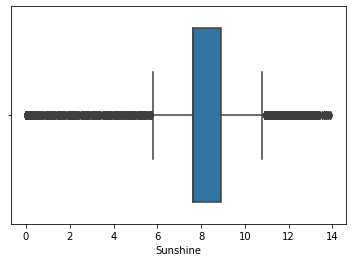



The Box-Plot for attribute "WindGustDir" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


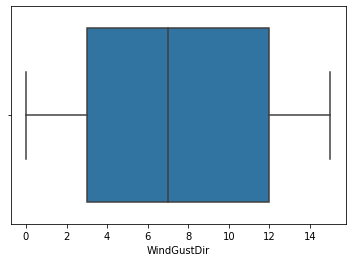



The Box-Plot for attribute "WindGustSpeed" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


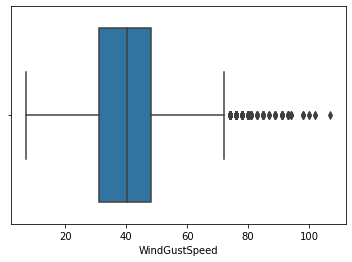



The Box-Plot for attribute "WindDir9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


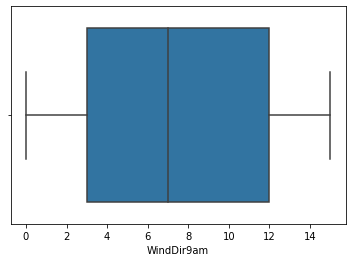



The Box-Plot for attribute "WindDir3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


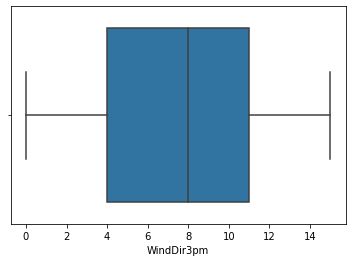



The Box-Plot for attribute "WindSpeed9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


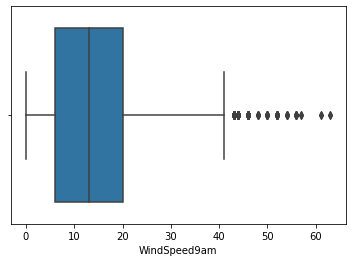



The Box-Plot for attribute "WindSpeed3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


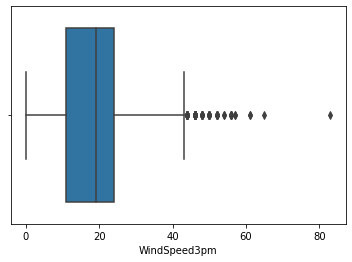



The Box-Plot for attribute "Humidity9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


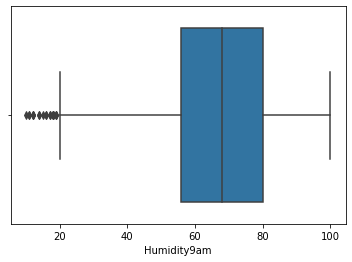



The Box-Plot for attribute "Humidity3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


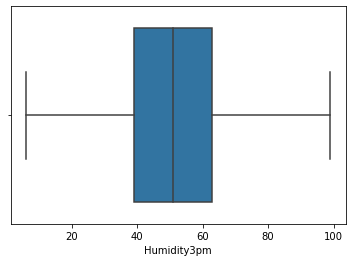



The Box-Plot for attribute "Pressure9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


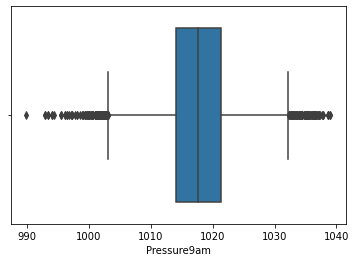



The Box-Plot for attribute "Pressure3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


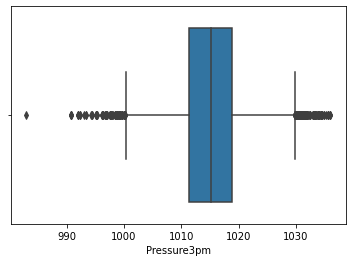



The Box-Plot for attribute "Cloud9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


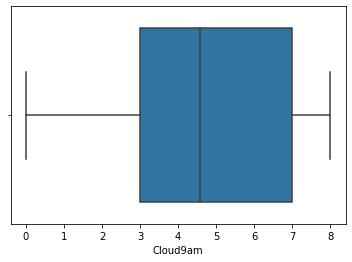



The Box-Plot for attribute "Cloud3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


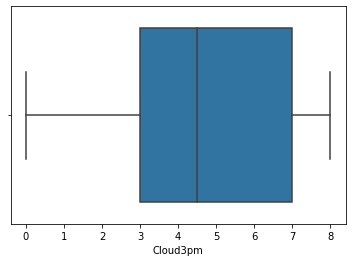



The Box-Plot for attribute "Temp9am" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


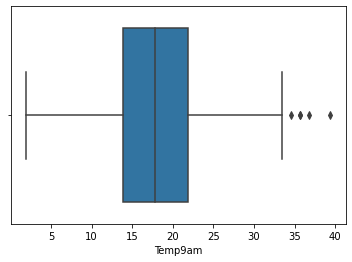



The Box-Plot for attribute "Temp3pm" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


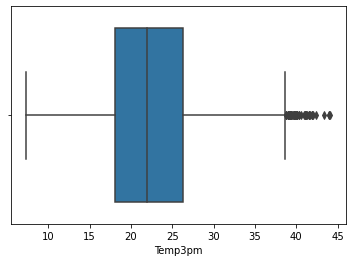



The Box-Plot for attribute "RainToday" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


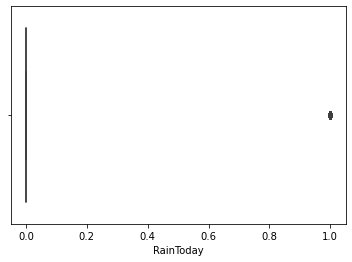



The Box-Plot for attribute "RainTomorrow" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


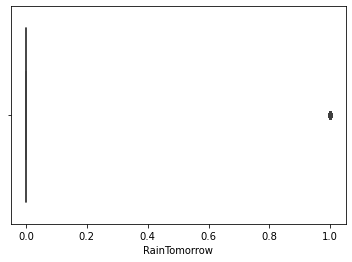

In [69]:
for i in df.columns:
    print(f'The Box-Plot for attribute "{i}" is-\n {sns.boxplot(df[i])}')
    plt.show()
    print('\n')

### Data Cleansing
### 1.Remove Negative Correlation

In [71]:
df1=df.drop(['Temp9am','Location','Date'],axis=1)
df1

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp3pm,RainToday,RainTomorrow
0,13.4,22.900000,0.6,5.389395,7.632205,13,44.000000,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,21.8,0,0
1,7.4,25.100000,0.0,5.389395,7.632205,14,44.000000,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,24.3,0,0
2,12.9,25.700000,0.0,5.389395,7.632205,15,46.000000,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,23.2,0,0
3,9.2,28.000000,0.0,5.389395,7.632205,4,24.000000,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,26.5,0,0
4,17.5,32.300000,1.0,5.389395,7.632205,13,41.000000,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.400000,0.0,5.389395,7.632205,0,31.000000,9,1,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,22.4,0,0
8421,3.6,25.300000,0.0,5.389395,7.632205,6,22.000000,9,3,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,24.5,0,0
8422,5.4,26.900000,0.0,5.389395,7.632205,3,37.000000,9,14,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,26.1,0,0
8423,7.8,27.000000,0.0,5.389395,7.632205,9,28.000000,10,3,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,26.0,0,0


### 2.Removing Multicollinearity

In [72]:
import statsmodels.api
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [73]:
x=df1.drop('Rainfall',axis=1)
x

,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp3pm,RainToday,RainTomorrow
0,13.4,22.900000,5.389395,7.632205,13,44.000000,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,21.8,0,0
1,7.4,25.100000,5.389395,7.632205,14,44.000000,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,24.3,0,0
2,12.9,25.700000,5.389395,7.632205,15,46.000000,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,23.2,0,0
3,9.2,28.000000,5.389395,7.632205,4,24.000000,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,26.5,0,0
4,17.5,32.300000,5.389395,7.632205,13,41.000000,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.400000,5.389395,7.632205,0,31.000000,9,1,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,22.4,0,0
8421,3.6,25.300000,5.389395,7.632205,6,22.000000,9,3,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,24.5,0,0
8422,5.4,26.900000,5.389395,7.632205,3,37.000000,9,14,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,26.1,0,0
8423,7.8,27.000000,5.389395,7.632205,9,28.000000,10,3,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,26.0,0,0


In [74]:
def vif():
    df2=pd.DataFrame()
    df2['Features']=x.columns
    df2['VIF_Score']=[variance_inflation_factor(x.values,k) for k in range(x.shape[1])]
    print(df2)

In [75]:
vif()

         Features      VIF_Score
0         MinTemp      35.272567
1         MaxTemp     412.548383
2     Evaporation       3.455684
3        Sunshine      15.154025
4     WindGustDir       5.249089
5   WindGustSpeed      21.318592
6      WindDir9am       4.684807
7      WindDir3pm       5.992891
8    WindSpeed9am       5.690122
9    WindSpeed3pm       8.832568
10    Humidity9am      43.935890
11    Humidity3pm      37.330180
12    Pressure9am  513241.826066
13    Pressure3pm  512484.558447
14       Cloud9am       8.618471
15       Cloud3pm       8.856517
16        Temp3pm     463.524005
17      RainToday       1.802830
18   RainTomorrow       1.885008


Attributes (MaxTemp,Temp3pm) and (Pressure9am,Pressure3pm) are providing the same informatiom to the target variable hence will drop the attributes which are less correlative w.r.t. target variables

In [76]:
df3=df1.drop(['Temp3pm','Pressure9am'],axis=1)
df3

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday,RainTomorrow
0,13.4,22.900000,0.6,5.389395,7.632205,13,44.000000,13,14,20.0,24.0,71.0,22.0,1007.1,8.000000,4.503183,0,0
1,7.4,25.100000,0.0,5.389395,7.632205,14,44.000000,6,15,4.0,22.0,44.0,25.0,1007.8,4.566622,4.503183,0,0
2,12.9,25.700000,0.0,5.389395,7.632205,15,46.000000,13,15,19.0,26.0,38.0,30.0,1008.7,4.566622,2.000000,0,0
3,9.2,28.000000,0.0,5.389395,7.632205,4,24.000000,9,0,11.0,9.0,45.0,16.0,1012.8,4.566622,4.503183,0,0
4,17.5,32.300000,1.0,5.389395,7.632205,13,41.000000,1,7,7.0,20.0,82.0,33.0,1006.0,7.000000,8.000000,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.400000,0.0,5.389395,7.632205,0,31.000000,9,1,13.0,11.0,51.0,24.0,1020.3,4.566622,4.503183,0,0
8421,3.6,25.300000,0.0,5.389395,7.632205,6,22.000000,9,3,13.0,9.0,56.0,21.0,1019.1,4.566622,4.503183,0,0
8422,5.4,26.900000,0.0,5.389395,7.632205,3,37.000000,9,14,9.0,9.0,53.0,24.0,1016.8,4.566622,4.503183,0,0
8423,7.8,27.000000,0.0,5.389395,7.632205,9,28.000000,10,3,13.0,7.0,51.0,24.0,1016.5,3.000000,2.000000,0,0


### 3.Removing Outliers

In [77]:
df4=df3[(z<3).all(axis=1)]
df4

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday,RainTomorrow
0,13.4,22.900000,0.6,5.389395,7.632205,13,44.000000,13,14,20.0,24.0,71.0,22.0,1007.1,8.000000,4.503183,0,0
1,7.4,25.100000,0.0,5.389395,7.632205,14,44.000000,6,15,4.0,22.0,44.0,25.0,1007.8,4.566622,4.503183,0,0
2,12.9,25.700000,0.0,5.389395,7.632205,15,46.000000,13,15,19.0,26.0,38.0,30.0,1008.7,4.566622,2.000000,0,0
3,9.2,28.000000,0.0,5.389395,7.632205,4,24.000000,9,0,11.0,9.0,45.0,16.0,1012.8,4.566622,4.503183,0,0
4,17.5,32.300000,1.0,5.389395,7.632205,13,41.000000,1,7,7.0,20.0,82.0,33.0,1006.0,7.000000,8.000000,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.400000,0.0,5.389395,7.632205,0,31.000000,9,1,13.0,11.0,51.0,24.0,1020.3,4.566622,4.503183,0,0
8421,3.6,25.300000,0.0,5.389395,7.632205,6,22.000000,9,3,13.0,9.0,56.0,21.0,1019.1,4.566622,4.503183,0,0
8422,5.4,26.900000,0.0,5.389395,7.632205,3,37.000000,9,14,9.0,9.0,53.0,24.0,1016.8,4.566622,4.503183,0,0
8423,7.8,27.000000,0.0,5.389395,7.632205,9,28.000000,10,3,13.0,7.0,51.0,24.0,1016.5,3.000000,2.000000,0,0


In [78]:
print(df3.shape)
print(df4.shape)

(8425, 18)
(7987, 18)


In [79]:
percentage_loss=(8425-7987)*100/8425
percentage_loss

5.198813056379822

I'm getting the percentage loss is about 5% which is decent because our dataset is large having 8425 rows and out of it we are loosing only 5% rows.Now we can move ahead by considering it

### 4.Removing Skewness
### Power_Transformer

In [81]:
from sklearn.preprocessing import PowerTransformer

In [82]:
x=df4.drop('Rainfall',axis=1)
x

,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday,RainTomorrow
0,13.4,22.900000,5.389395,7.632205,13,44.000000,13,14,20.0,24.0,71.0,22.0,1007.1,8.000000,4.503183,0,0
1,7.4,25.100000,5.389395,7.632205,14,44.000000,6,15,4.0,22.0,44.0,25.0,1007.8,4.566622,4.503183,0,0
2,12.9,25.700000,5.389395,7.632205,15,46.000000,13,15,19.0,26.0,38.0,30.0,1008.7,4.566622,2.000000,0,0
3,9.2,28.000000,5.389395,7.632205,4,24.000000,9,0,11.0,9.0,45.0,16.0,1012.8,4.566622,4.503183,0,0
4,17.5,32.300000,5.389395,7.632205,13,41.000000,1,7,7.0,20.0,82.0,33.0,1006.0,7.000000,8.000000,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.400000,5.389395,7.632205,0,31.000000,9,1,13.0,11.0,51.0,24.0,1020.3,4.566622,4.503183,0,0
8421,3.6,25.300000,5.389395,7.632205,6,22.000000,9,3,13.0,9.0,56.0,21.0,1019.1,4.566622,4.503183,0,0
8422,5.4,26.900000,5.389395,7.632205,3,37.000000,9,14,9.0,9.0,53.0,24.0,1016.8,4.566622,4.503183,0,0
8423,7.8,27.000000,5.389395,7.632205,9,28.000000,10,3,13.0,7.0,51.0,24.0,1016.5,3.000000,2.000000,0,0


In [83]:
pt=PowerTransformer(method='yeo-johnson')
x=pt.fit_transform(x)
x

array([[ 6.05015740e-02, -7.57272296e-02,  1.86310827e-01, ...,
        -9.87238955e-04, -5.42475525e-01, -5.43635296e-01],
       [-1.05725282e+00,  2.87144714e-01,  1.86310827e-01, ...,
        -9.87238955e-04, -5.42475525e-01, -5.43635296e-01],
       [-3.22219600e-02,  3.82999789e-01,  1.86310827e-01, ...,
        -1.08215177e+00, -5.42475525e-01, -5.43635296e-01],
       ...,
       [-1.43299533e+00,  5.71022930e-01,  1.86310827e-01, ...,
        -9.87238955e-04, -5.42475525e-01, -5.43635296e-01],
       [-9.82333711e-01,  5.86477671e-01,  1.86310827e-01, ...,
        -1.08215177e+00, -5.42475525e-01, -5.43635296e-01],
       [ 3.38295674e-01,  8.49017248e-02,  1.86310827e-01, ...,
         1.55904423e+00, -5.42475525e-01, -5.43635296e-01]])

In [84]:
df4.skew().sort_values()

Sunshine        -0.723970
Cloud9am        -0.356892
Cloud3pm        -0.266829
Humidity9am     -0.231656
WindDir3pm      -0.126255
MinTemp         -0.084549
Pressure3pm      0.044876
WindGustDir      0.112339
Humidity3pm      0.125150
WindDir9am       0.160081
WindSpeed3pm     0.300109
MaxTemp          0.314510
WindGustSpeed    0.506897
WindSpeed9am     0.711395
Evaporation      0.846181
RainTomorrow     1.296077
RainToday        1.301170
Rainfall         3.488446
dtype: float64

In [85]:
for i in ['Evaporation','WindSpeed9am','Sunshine']:
    df4[i]=np.sqrt(df4[i])

In [86]:
df4.skew().sort_values()

Sunshine        -2.045075
WindSpeed9am    -0.517704
Evaporation     -0.410953
Cloud9am        -0.356892
Cloud3pm        -0.266829
Humidity9am     -0.231656
WindDir3pm      -0.126255
MinTemp         -0.084549
Pressure3pm      0.044876
WindGustDir      0.112339
Humidity3pm      0.125150
WindDir9am       0.160081
WindSpeed3pm     0.300109
MaxTemp          0.314510
WindGustSpeed    0.506897
RainTomorrow     1.296077
RainToday        1.301170
Rainfall         3.488446
dtype: float64

### Using Standard Scaler

In [87]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

In [88]:
x=df4.drop('Rainfall',axis=1)
x

,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday,RainTomorrow
0,13.4,22.900000,2.321507,2.762645,13,44.000000,13,14,4.472136,24.0,71.0,22.0,1007.1,8.000000,4.503183,0,0
1,7.4,25.100000,2.321507,2.762645,14,44.000000,6,15,2.000000,22.0,44.0,25.0,1007.8,4.566622,4.503183,0,0
2,12.9,25.700000,2.321507,2.762645,15,46.000000,13,15,4.358899,26.0,38.0,30.0,1008.7,4.566622,2.000000,0,0
3,9.2,28.000000,2.321507,2.762645,4,24.000000,9,0,3.316625,9.0,45.0,16.0,1012.8,4.566622,4.503183,0,0
4,17.5,32.300000,2.321507,2.762645,13,41.000000,1,7,2.645751,20.0,82.0,33.0,1006.0,7.000000,8.000000,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.400000,2.321507,2.762645,0,31.000000,9,1,3.605551,11.0,51.0,24.0,1020.3,4.566622,4.503183,0,0
8421,3.6,25.300000,2.321507,2.762645,6,22.000000,9,3,3.605551,9.0,56.0,21.0,1019.1,4.566622,4.503183,0,0
8422,5.4,26.900000,2.321507,2.762645,3,37.000000,9,14,3.000000,9.0,53.0,24.0,1016.8,4.566622,4.503183,0,0
8423,7.8,27.000000,2.321507,2.762645,9,28.000000,10,3,3.605551,7.0,51.0,24.0,1016.5,3.000000,2.000000,0,0


In [89]:
x=sc.fit_transform(x)
x

array([[ 0.05644354, -0.14573194,  0.22368996, ...,  0.01313815,
        -0.54247553, -0.5436353 ],
       [-1.05847646,  0.22067594,  0.22368996, ...,  0.01313815,
        -0.54247553, -0.5436353 ],
       [-0.03646646,  0.32060536,  0.22368996, ..., -1.07666074,
        -0.54247553, -0.5436353 ],
       ...,
       [-1.43011646,  0.5204642 ,  0.22368996, ...,  0.01313815,
        -0.54247553, -0.5436353 ],
       [-0.98414846,  0.5371191 ,  0.22368996, ..., -1.07666074,
        -0.54247553, -0.5436353 ],
       [ 0.33517354,  0.01415115,  0.22368996, ...,  1.5355312 ,
        -0.54247553, -0.5436353 ]])

In [90]:
x.mean()

1.3707536821231607e-15

In [91]:
x.std()

1.0

<AxesSubplot:ylabel='Density'>

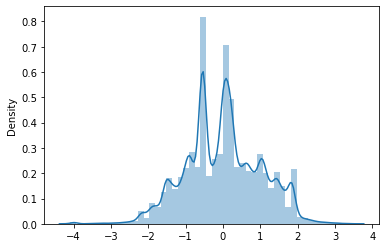

In [92]:
sns.distplot(x)

##### Now,almost our features is normally distributed as we have got the mean almost as zero and standard deviation=1 i.e. data is fully transformed in b/w 0-1
### Using Principle Component Analysis(PCA)

In [93]:
from sklearn.decomposition import PCA

In [94]:
#reducing the variables into 5 components
pca=PCA(n_components=5)
x=pca.fit_transform(x)
x

array([[ 0.3638784 ,  1.27935099, -1.89200498, -1.45552204, -1.23576108],
       [ 1.21870288,  0.00462049, -1.84228143, -1.22852849, -1.28908111],
       [ 1.77851212,  1.06005395, -2.8198063 , -1.42030025, -0.67656838],
       ...,
       [ 0.93969058, -1.33750411, -0.90459085, -0.29407395, -1.15107971],
       [ 1.55019554, -1.85159081, -0.59043489, -0.10085034, -0.36931784],
       [ 0.29975491,  0.25148499,  1.28746736,  1.37693739, -1.81986028]])

In [95]:
#target variable
y=df4['Rainfall']
y

0       0.6
1       0.0
2       0.0
3       0.0
4       1.0
       ... 
8420    0.0
8421    0.0
8422    0.0
8423    0.0
8424    0.0
Name: Rainfall, Length: 7987, dtype: float64

In [96]:
print(x.shape)
print(y.shape)

(7987, 5)
(7987,)


### Plotting the Relationship b/w Principle Components

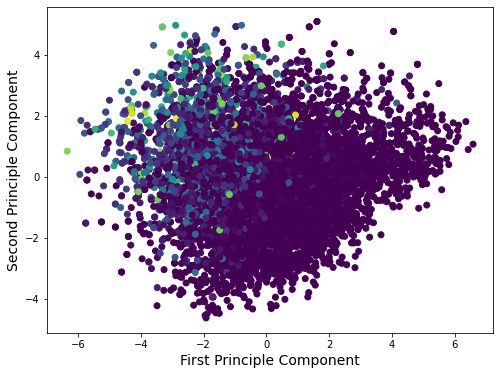

In [97]:
plt.figure(figsize=(8,6))
plt.scatter(x[:,0:1],x[:,1:2],c=y)
plt.xlabel('First Principle Component',fontsize=14)
plt.ylabel('Second Principle Component',fontsize=14)
plt.show()

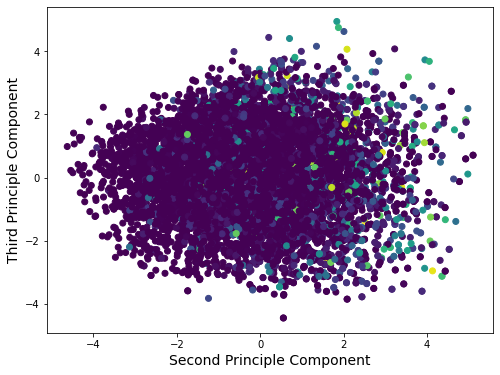

In [98]:
plt.figure(figsize=(8,6))
plt.scatter(x[:,1],x[:,2],c=y)
plt.xlabel('Second Principle Component',fontsize=14)
plt.ylabel('Third Principle Component',fontsize=14)
plt.show()

##### Above two diagrams tells us that our feature variables are distributed and mixed well

### Training_Testing Phase
##### I am going to train 80% of the data and testing size would be 20%
##### first will try to find out the best value for random_state

In [99]:
#importing machine learning libraries for regression model
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
lr=LinearRegression()

In [100]:
#will finding best value of random_state
for i in range(0,50):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
    lr.fit(x_train,y_train)
    train_pred=lr.predict(x_train)
    test_pred=lr.predict(x_test)
    if(r2_score(train_pred,y_train))==(r2_score(test_pred,y_test)):
        print(f'At Random_State {i} the training accuracy and testing accuracy both are same')
        print(f'Training Accuracy is {r2_score(train_pred,y_train)}')
        print(f'Testing Accuracy is {r2_score(test_pred,y_test)}')
        print(f'The Mean Absolute Error is(MAE)- {mean_absolute_error(test_pred,y_test)}')
        print(f'The Mean Squared Error is(MSE)- {mean_squared_error(test_pred,y_test)}')
        print(f'The Root Mean Squared Error(RMSE) is- {np.sqrt(mean_squared_error(test_pred,y_test))}')
        print('\n')
    else:
        print(f'At Random_State {i} the training accuracy and testing accuracy both are not same')
        print(f'Training Accuracy is {r2_score(train_pred,y_train)}')
        print(f'Testing Accuracy is {r2_score(test_pred,y_test)}')
        print(f'\nThe Mean Absolute Error is (MAE)- {mean_absolute_error(test_pred,y_test)}')
        print(f'The Mean Squared Error is (MSE)- {mean_squared_error(test_pred,y_test)}')
        print(f'The Root Mean Squared Error is (RMSE)- {np.sqrt(mean_squared_error(test_pred,y_test))}')
        print('\n')

At Random_State 0 the training accuracy and testing accuracy both are not same
Training Accuracy is -0.776802978196284
Testing Accuracy is -0.8005481778408567

The Mean Absolute Error is (MAE)- 2.2417792078208536
The Mean Squared Error is (MSE)- 14.036325225886696
The Root Mean Squared Error is (RMSE)- 3.746508404619786


At Random_State 1 the training accuracy and testing accuracy both are not same
Training Accuracy is -0.8346675555145875
Testing Accuracy is -0.8538283569578644

The Mean Absolute Error is (MAE)- 2.2935537392765246
The Mean Squared Error is (MSE)- 15.333619273355973
The Root Mean Squared Error is (RMSE)- 3.915816552566779


At Random_State 2 the training accuracy and testing accuracy both are not same
Training Accuracy is -0.8104444634606993
Testing Accuracy is -1.0562414775598468

The Mean Absolute Error is (MAE)- 2.3165689724178327
The Mean Squared Error is (MSE)- 16.781437302763663
The Root Mean Squared Error is (RMSE)- 4.096515263338301


At Random_State 3 the trai

### Finding Out CV Score

In [101]:
from sklearn.model_selection import cross_val_score

In [102]:
for n in range(2,5):
    cvscore=cross_val_score(lr,x,y,cv=n)
    mean=cvscore.mean()
    std=cvscore.std()
    print(f'At K-Fold {n} The CV Score of Linear Regression Model is {mean*100} and Standard Deviation is {std}')
    print('\n')

At K-Fold 2 The CV Score of Linear Regression Model is 35.063481848211694 and Standard Deviation is 0.0023569740107169945


At K-Fold 3 The CV Score of Linear Regression Model is 34.80025472294258 and Standard Deviation is 0.011770252492446053


At K-Fold 4 The CV Score of Linear Regression Model is 34.89383253982378 and Standard Deviation is 0.020887219313034285




We're getting highest CV score as 35% at each K-Fold and less testing accuracy with linear regression model hence will go for other model as well to check it's CV score and testing accuracy both

In [103]:
#importing other libraries
from sklearn.linear_model import Lasso,Ridge,ElasticNet,SGDRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor
ls=Lasso()
rd=Ridge()
en=ElasticNet()
sgd=SGDRegressor()
rf=RandomForestRegressor()
ad=AdaBoostRegressor()
grd=GradientBoostingRegressor()

In [104]:
#creating a definition to expand the model individually
def model(m,x,y):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)
    m.fit(x_train,y_train)
    train_pred=m.predict(x_train)
    test_pred=m.predict(x_test)
    print(f'Training Accuracy of model {m} is {r2_score(train_pred,y_train)}')
    print(f'Testing Accuracy of model {m} is {r2_score(test_pred,y_test)}')
    print('\nError in the model is calculated below-\n')
    print(f'The Mean Absolute Error is (MAE) {mean_absolute_error(test_pred,y_test)}')
    print(f'The Mean Squared Error is (MSE) {mean_squared_error(test_pred,y_test)}')
    print(f'The Root Mean Squared Error is (RMSE) {np.sqrt(mean_squared_error(test_pred,y_test))}')
    print('\n')
    print('Finding out the best K-Fold Value')
    print('\n\t')
    for j in range(2,5):
        cvs=cross_val_score(m,x,y,cv=j)
        cvs.mean()
        cvs.std()
        print(f'At K-Fold {j} the CV Score of model {m} is {cvs.mean()*100} & std is {cvs.std()}')
        print('\n')
    print('\n\t')
    plt.scatter(y_test,test_pred,color='c')
    plt.plot(y_test,y_test,color='m')
    plt.xlabel("Actual Rainfall",fontsize=15)
    plt.ylabel("Predicted Rainfall",fontsize=15)
    plt.title(f"Best Fitted Line for the model {m}",fontsize=18)
    plt.show()

Training Accuracy of model Lasso() is -5.955486891467429
Testing Accuracy of model Lasso() is -7.008674267844185

Error in the model is calculated below-

The Mean Absolute Error is (MAE) 2.226691179713917
The Mean Squared Error is (MSE) 18.63151452362565
The Root Mean Squared Error is (RMSE) 4.3164238118638965


Finding out the best K-Fold Value

	
At K-Fold 2 the CV Score of model Lasso() is 26.790049769188524 & std is 0.008431971047983822


At K-Fold 3 the CV Score of model Lasso() is 26.59493977389819 & std is 0.015458673431400616


At K-Fold 4 the CV Score of model Lasso() is 26.341668954820275 & std is 0.02865723798531931



	


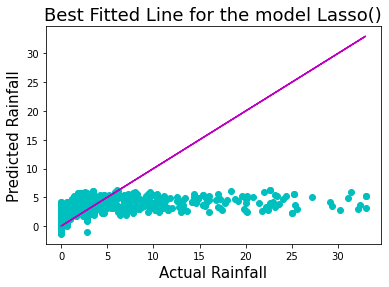

In [105]:
model(ls,x,y)

Training Accuracy of model Ridge() is -0.8058327708231674
Testing Accuracy of model Ridge() is -1.0601501715698447

Error in the model is calculated below-

The Mean Absolute Error is (MAE) 2.256164657287411
The Mean Squared Error is (MSE) 16.07939674487552
The Root Mean Squared Error is (RMSE) 4.009912311369853


Finding out the best K-Fold Value

	
At K-Fold 2 the CV Score of model Ridge() is 35.06412894688566 & std is 0.0023578502395842915


At K-Fold 3 the CV Score of model Ridge() is 34.80050467951347 & std is 0.01177425609918061


At K-Fold 4 the CV Score of model Ridge() is 34.89394648479453 & std is 0.0208930881495764



	


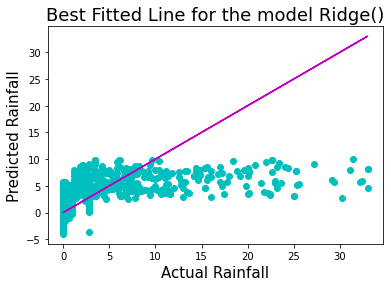

In [106]:
model(rd,x,y)

Training Accuracy of model ElasticNet() is -4.475712180901672
Testing Accuracy of model ElasticNet() is -5.287759450751113

Error in the model is calculated below-

The Mean Absolute Error is (MAE) 2.189726485756186
The Mean Squared Error is (MSE) 18.13404991374281
The Root Mean Squared Error is (RMSE) 4.258409317308848


Finding out the best K-Fold Value

	
At K-Fold 2 the CV Score of model ElasticNet() is 28.446211911094398 & std is 0.003811422951927046


At K-Fold 3 the CV Score of model ElasticNet() is 28.31908223877717 & std is 0.016959504232352735


At K-Fold 4 the CV Score of model ElasticNet() is 28.058384382060208 & std is 0.03372830177881462



	


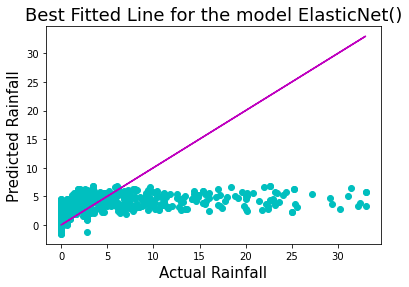

In [107]:
model(en,x,y)

Training Accuracy of model SGDRegressor() is -0.9138281304921505
Testing Accuracy of model SGDRegressor() is -1.189902133317092

Error in the model is calculated below-

The Mean Absolute Error is (MAE) 2.224521973431195
The Mean Squared Error is (MSE) 16.14291357832651
The Root Mean Squared Error is (RMSE) 4.017824483265354


Finding out the best K-Fold Value

	
At K-Fold 2 the CV Score of model SGDRegressor() is 34.661943739277056 & std is 0.00145096615043816


At K-Fold 3 the CV Score of model SGDRegressor() is 34.91552613194149 & std is 0.012675261455609741


At K-Fold 4 the CV Score of model SGDRegressor() is 34.46756576581883 & std is 0.021637833605307074



	


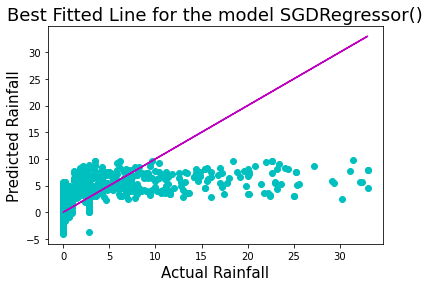

In [108]:
model(sgd,x,y)

Training Accuracy of model RandomForestRegressor() is 0.9073789820360861
Testing Accuracy of model RandomForestRegressor() is 0.08051818444279635

Error in the model is calculated below-

The Mean Absolute Error is (MAE) 1.3536518258789176
The Mean Squared Error is (MSE) 11.186886108567158
The Root Mean Squared Error is (RMSE) 3.3446802700059624


Finding out the best K-Fold Value

	
At K-Fold 2 the CV Score of model RandomForestRegressor() is 32.044525903282164 & std is 0.030224164042098267


At K-Fold 3 the CV Score of model RandomForestRegressor() is 39.293671052018766 & std is 0.05942443657851881


At K-Fold 4 the CV Score of model RandomForestRegressor() is 35.727787944489165 & std is 0.021348246741001123



	


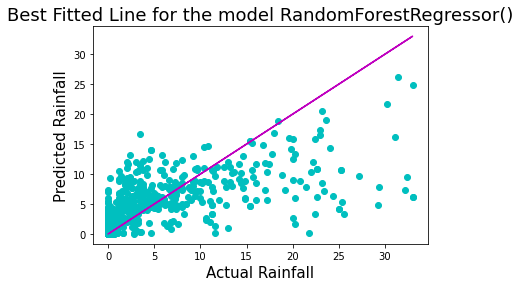

In [109]:
model(rf,x,y)

Training Accuracy of model AdaBoostRegressor() is -0.15469911883696508
Testing Accuracy of model AdaBoostRegressor() is -0.3730977042925776

Error in the model is calculated below-

The Mean Absolute Error is (MAE) 2.3997183739397614
The Mean Squared Error is (MSE) 17.588823202799638
The Root Mean Squared Error is (RMSE) 4.193903098880521


Finding out the best K-Fold Value

	
At K-Fold 2 the CV Score of model AdaBoostRegressor() is 17.130705337382825 & std is 0.07129068829257135


At K-Fold 3 the CV Score of model AdaBoostRegressor() is 8.748004949801429 & std is 0.13037579973294097


At K-Fold 4 the CV Score of model AdaBoostRegressor() is 18.50361038510474 & std is 0.0883565002329165



	


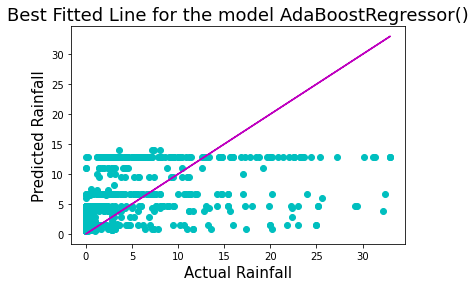

In [110]:
model(ad,x,y)

Training Accuracy of model GradientBoostingRegressor() is -0.014094811279376396
Testing Accuracy of model GradientBoostingRegressor() is -0.6680681384011344

Error in the model is calculated below-

The Mean Absolute Error is (MAE) 1.715512825042258
The Mean Squared Error is (MSE) 14.795565392748752
The Root Mean Squared Error is (RMSE) 3.846500408520549


Finding out the best K-Fold Value

	
At K-Fold 2 the CV Score of model GradientBoostingRegressor() is 15.628679880030028 & std is 0.20750937176489037


At K-Fold 3 the CV Score of model GradientBoostingRegressor() is 38.00201003569066 & std is 0.019927137163855635


At K-Fold 4 the CV Score of model GradientBoostingRegressor() is 35.96272984529196 & std is 0.05354515226754439



	


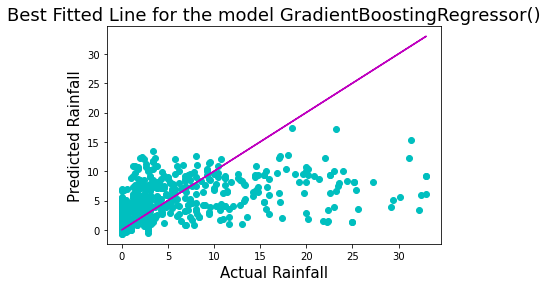

In [111]:
model(grd,x,y)

### Hyper Parameter Tuning
##### To make the model more accurate by providing their best parameters

In [115]:
from sklearn.model_selection import GridSearchCV

In [116]:
#defining all the parameters of the respective models
dict_ls={'alpha':[.0001,.001,.01,.1,1,10],'selection':['cyclic', 'random']}
dict_rd={'alpha':[.0001,.001,.01,.1,1,10],'solver':['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg','sag', 'saga', 'lbfgs']}
dict_en={'alpha':[.0001,.001,.01,.1,1,10],'selection':['cyclic', 'random']}
dict_rf={'criterion' : ["squared_error", "absolute_error", "poisson"],'max_features':["sqrt", "log2", None]}
dict_ad={'loss':['linear', 'square', 'exponential']}
dict_grd={'loss':['squared_error', 'absolute_error', 'huber', 'quantile'],'criterion':['friedman_mse', 'squared_error', 'mse'],'max_features':['auto', 'sqrt', 'log2']}
dict_sgd={'alpha':[.0001,.001,.01,.1,1,10],'penalty':['l2', 'l1', 'elasticnet'],'learning_rate':['constant', 'optimal', 'invscaling','adaptive'],'loss':['squared_error','huber','epsilon_insensitive','squared_epsilon_insensitive']}

In [117]:
#Now I'm defining a function so that i can individuallay let the model perfom and give the best parameter out of it.
def HPT(machine,dictionary):
    grd=GridSearchCV(machine,dictionary)
    grd.fit(x,y)
    print(f'The best Parameters of the model {machine} are {grd.best_params_}')

In [118]:
HPT(ls,dict_ls)

The best Parameters of the model Lasso() are {'alpha': 0.01, 'selection': 'random'}


In [119]:
HPT(rd,dict_rd)

The best Parameters of the model Ridge() are {'alpha': 0.0001, 'solver': 'saga'}


In [120]:
HPT(en,dict_en)

The best Parameters of the model ElasticNet() are {'alpha': 0.1, 'selection': 'random'}


In [121]:
HPT(sgd,dict_sgd)

The best Parameters of the model SGDRegressor() are {'alpha': 0.01, 'learning_rate': 'optimal', 'loss': 'squared_error', 'penalty': 'l2'}


In [122]:
HPT(rf,dict_rf)

The best Parameters of the model RandomForestRegressor() are {'criterion': 'poisson', 'max_features': 'sqrt'}


In [123]:
HPT(ad,dict_ad)

The best Parameters of the model AdaBoostRegressor() are {'loss': 'linear'}


In [124]:
HPT(grd,dict_grd)

The best Parameters of the model GradientBoostingRegressor() are {'criterion': 'friedman_mse', 'loss': 'squared_error', 'max_features': 'sqrt'}


In [125]:
#Redefining the models after getting the parameters
ls=Lasso(alpha=0.01,selection='random')
rd=Ridge(alpha=0.0001,solver='saga')
en=ElasticNet(alpha=0.1,selection='random')
rf=RandomForestRegressor(criterion='poisson',max_features='sqrt')
ad=AdaBoostRegressor(loss='linear')
grd=GradientBoostingRegressor(criterion='friedman_mse',loss='squared_error',max_features='sqrt')
sgd=SGDRegressor(alpha=0.01,learning_rate='optimal',penalty='l2',loss='squared_error')

Training Accuracy of model LinearRegression() is -0.8054835959324849
Testing Accuracy of model LinearRegression() is -1.0597427687284684

Error in the model is calculated below-

The Mean Absolute Error is (MAE) 2.2562406409527895
The Mean Squared Error is (MSE) 16.07925584063399
The Root Mean Squared Error is (RMSE) 4.009894741839739


Finding out the best K-Fold Value

	
At K-Fold 2 the CV Score of model LinearRegression() is 35.063481848211694 & std is 0.0023569740107169945


At K-Fold 3 the CV Score of model LinearRegression() is 34.80025472294258 & std is 0.011770252492446053


At K-Fold 4 the CV Score of model LinearRegression() is 34.89383253982378 & std is 0.020887219313034285



	


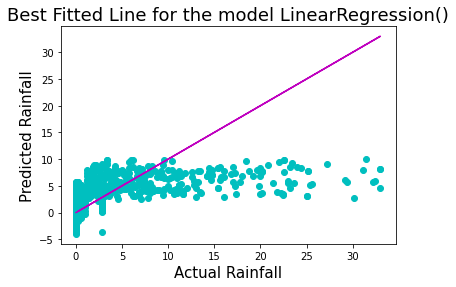

In [126]:
model(lr,x,y)

Training Accuracy of model Lasso(alpha=0.01, selection='random') is -0.8242287228704019
Testing Accuracy of model Lasso(alpha=0.01, selection='random') is -1.0818371076821651

Error in the model is calculated below-

The Mean Absolute Error is (MAE) 2.252350063366779
The Mean Squared Error is (MSE) 16.08603257861181
The Root Mean Squared Error is (RMSE) 4.010739654803315


Finding out the best K-Fold Value

	
At K-Fold 2 the CV Score of model Lasso(alpha=0.01, selection='random') is 35.09602094614177 & std is 0.0025668772127586115


At K-Fold 3 the CV Score of model Lasso(alpha=0.01, selection='random') is 34.807502195679014 & std is 0.011927261239994491


At K-Fold 4 the CV Score of model Lasso(alpha=0.01, selection='random') is 34.89427358435421 & std is 0.02116215207601512



	


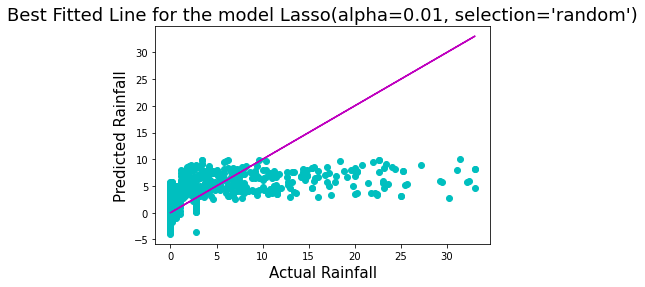

In [127]:
model(ls,x,y)

Training Accuracy of model Ridge(alpha=0.0001, solver='saga') is -0.8057281611264011
Testing Accuracy of model Ridge(alpha=0.0001, solver='saga') is -1.060031346190311

Error in the model is calculated below-

The Mean Absolute Error is (MAE) 2.256182827357362
The Mean Squared Error is (MSE) 16.079350628040444
The Root Mean Squared Error is (RMSE) 4.009906561011172


Finding out the best K-Fold Value

	
At K-Fold 2 the CV Score of model Ridge(alpha=0.0001, solver='saga') is 35.06348219436918 & std is 0.0023640173417687205


At K-Fold 3 the CV Score of model Ridge(alpha=0.0001, solver='saga') is 34.80148294144885 & std is 0.01176815097777664


At K-Fold 4 the CV Score of model Ridge(alpha=0.0001, solver='saga') is 34.89229541690596 & std is 0.020888054594249063



	


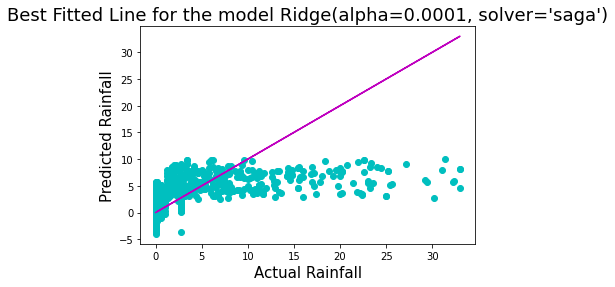

In [128]:
model(rd,x,y)

Training Accuracy of model ElasticNet(alpha=0.1, selection='random') is -1.022607385110616
Testing Accuracy of model ElasticNet(alpha=0.1, selection='random') is -1.3136580691939796

Error in the model is calculated below-

The Mean Absolute Error is (MAE) 2.217363174498261
The Mean Squared Error is (MSE) 16.180706600211895
The Root Mean Squared Error is (RMSE) 4.022524903616122


Finding out the best K-Fold Value

	
At K-Fold 2 the CV Score of model ElasticNet(alpha=0.1, selection='random') is 35.16499126920694 & std is 0.0032524283580952495


At K-Fold 3 the CV Score of model ElasticNet(alpha=0.1, selection='random') is 34.76661839278652 & std is 0.013412718789293803


At K-Fold 4 the CV Score of model ElasticNet(alpha=0.1, selection='random') is 34.79665732448557 & std is 0.023847797668718588



	


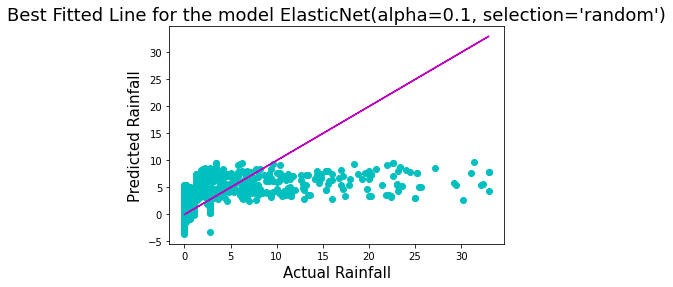

In [129]:
model(en,x,y)

Training Accuracy of model SGDRegressor(alpha=0.01, learning_rate='optimal') is -0.8081188160538015
Testing Accuracy of model SGDRegressor(alpha=0.01, learning_rate='optimal') is -1.062377522297243

Error in the model is calculated below-

The Mean Absolute Error is (MAE) 2.256271538644663
The Mean Squared Error is (MSE) 16.080831361313603
The Root Mean Squared Error is (RMSE) 4.010091191146855


Finding out the best K-Fold Value

	
At K-Fold 2 the CV Score of model SGDRegressor(alpha=0.01, learning_rate='optimal') is 34.97829992631351 & std is 0.0011099203246594525


At K-Fold 3 the CV Score of model SGDRegressor(alpha=0.01, learning_rate='optimal') is 34.288599138240095 & std is 0.017676914049514093


At K-Fold 4 the CV Score of model SGDRegressor(alpha=0.01, learning_rate='optimal') is 34.8155879124827 & std is 0.02143709775181201



	


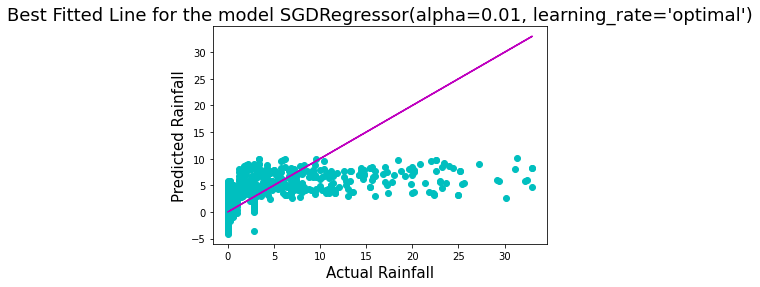

In [130]:
model(sgd,x,y)

Training Accuracy of model RandomForestRegressor(criterion='poisson', max_features='sqrt') is 0.8974111843814242
Testing Accuracy of model RandomForestRegressor(criterion='poisson', max_features='sqrt') is -0.0017929713990321172

Error in the model is calculated below-

The Mean Absolute Error is (MAE) 1.3484815323332522
The Mean Squared Error is (MSE) 10.950715554605477
The Root Mean Squared Error is (RMSE) 3.3091865397111535


Finding out the best K-Fold Value

	
At K-Fold 2 the CV Score of model RandomForestRegressor(criterion='poisson', max_features='sqrt') is 40.54363164693536 & std is 0.009946072781797544


At K-Fold 3 the CV Score of model RandomForestRegressor(criterion='poisson', max_features='sqrt') is 42.9094263987569 & std is 0.045791391245077355


At K-Fold 4 the CV Score of model RandomForestRegressor(criterion='poisson', max_features='sqrt') is 41.62863423945689 & std is 0.016434020526386147



	


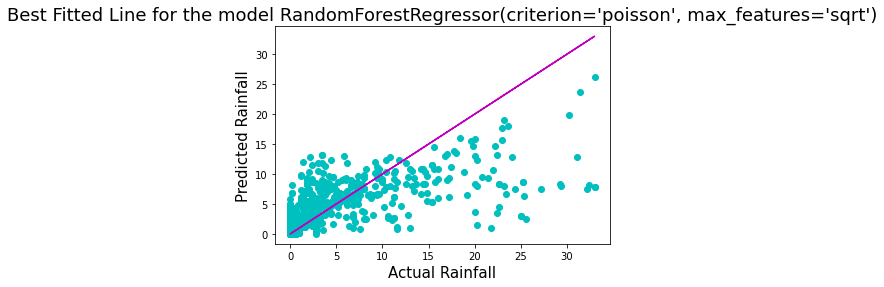

In [131]:
model(rf,x,y)

Training Accuracy of model AdaBoostRegressor() is 0.09491406345859199
Testing Accuracy of model AdaBoostRegressor() is 0.015408217071454011

Error in the model is calculated below-

The Mean Absolute Error is (MAE) 2.6866783709165087
The Mean Squared Error is (MSE) 19.235030060753665
The Root Mean Squared Error is (RMSE) 4.38577587899264


Finding out the best K-Fold Value

	
At K-Fold 2 the CV Score of model AdaBoostRegressor() is 18.319330810602036 & std is 0.031118773936544886


At K-Fold 3 the CV Score of model AdaBoostRegressor() is 11.752358999183954 & std is 0.11502186692116174


At K-Fold 4 the CV Score of model AdaBoostRegressor() is 16.142608996289702 & std is 0.09032730945622437



	


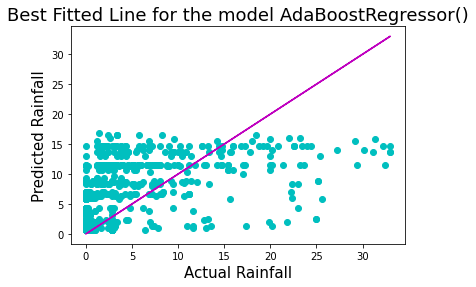

In [132]:
model(ad,x,y)

Training Accuracy of model GradientBoostingRegressor(max_features='sqrt') is -0.08962879445400174
Testing Accuracy of model GradientBoostingRegressor(max_features='sqrt') is -0.6916917623034589

Error in the model is calculated below-

The Mean Absolute Error is (MAE) 1.7521220621396123
The Mean Squared Error is (MSE) 14.635715333971554
The Root Mean Squared Error is (RMSE) 3.8256653452663048


Finding out the best K-Fold Value

	
At K-Fold 2 the CV Score of model GradientBoostingRegressor(max_features='sqrt') is 23.624121749201315 & std is 0.14028871437089535


At K-Fold 3 the CV Score of model GradientBoostingRegressor(max_features='sqrt') is 38.13064391237983 & std is 0.018368977097479398


At K-Fold 4 the CV Score of model GradientBoostingRegressor(max_features='sqrt') is 37.70013383703097 & std is 0.046669897218601306



	


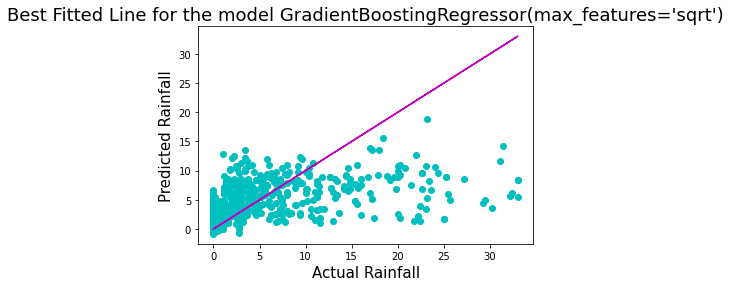

In [133]:
model(grd,x,y)

### Saving the Best Model

In [134]:
import joblib
file='rainfall_regrsn.obj'
joblib.dump(rf,file)

['rainfall_regrsn.obj']

### Loading the Modle

In [135]:
a=joblib.load('rainfall_regrsn.obj')
a

RandomForestRegressor(criterion='poisson', max_features='sqrt')

In [136]:
#making prediction
pred=a.predict(x_test)
pred

array([ 0.05940457,  4.73060133, 14.01988945, ...,  0.21235766,
        0.15478045,  0.08823532])

In [137]:
#Accuracy of RandomForestRegressor
accuracy_score=r2_score(pred,y_test)
accuracy_score

0.7288506628352689

<AxesSubplot:ylabel='Density'>

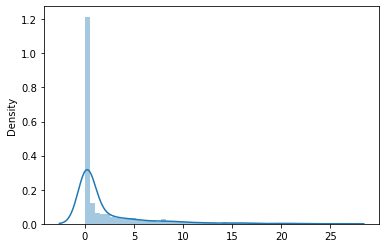

In [138]:
#plotting distribution plot to check normal distribution
sns.distplot(pred)

Text(0.5, 1.0, 'Best Fitted Line of the Model')

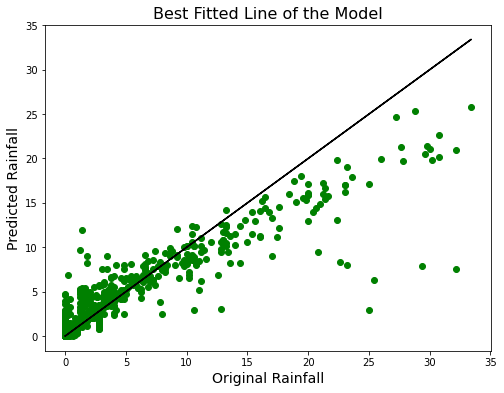

In [139]:
#Plotting Best-Fitted Line
plt.figure(figsize=(8,6))
plt.scatter(y_test,pred,color='GREEN')
plt.plot(y_test,y_test,color='black')
plt.xlabel('Original Rainfall',fontsize=14)
plt.ylabel('Predicted Rainfall',fontsize=14)
plt.title('Best Fitted Line of the Model',fontsize=16)

In [140]:
conclusion=pd.DataFrame(data=([pred,y_test]),index=['Predicted Rainfall','Original Rainfall'])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,1588,1589,1590,1591,1592,1593,1594,1595,1596,1597
Predicted Rainfall,0.059405,4.730601,14.019889,17.482037,1.534651,0.710206,7.42175,0.645961,0.106191,0.433153,...,0.337908,4.341075,4.812044,5.775709,0.155819,0.518577,0.203031,0.212358,0.15478,0.088235
Original Rainfall,0.000000,1.200000,16.800000,18.800000,2.805913,0.200000,8.00000,0.000000,0.000000,1.000000,...,0.000000,1.600000,4.200000,3.800000,0.200000,0.200000,0.000000,0.000000,0.00000,0.000000


###### When I deployed our RandomForestRegressor model to the y_test data what i found is that the testing accuracy of the model went to 73% which is excellent accuracy for predicting any target variable correctly.As,we can see that the distance b/w the datapoints of the predicted rainfall and original rainfall is not that high which indicates RMSE to be on lower side.which indicates that our model is performing well

### B): Classification Model Building(Taking Rain_Tomorrow as Target)
##### I've already done the EDA process in the first part hence will start by checking Correlation,outliers,skewness and all and later on will built a classification model
### Correlation

In [158]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0,1,13.4,22.900000,0.6,5.389395,7.632205,13,44.000000,13,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0
1,1,1,7.4,25.100000,0.0,5.389395,7.632205,14,44.000000,6,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0
2,2,1,12.9,25.700000,0.0,5.389395,7.632205,15,46.000000,13,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0
3,3,1,9.2,28.000000,0.0,5.389395,7.632205,4,24.000000,9,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0
4,4,1,17.5,32.300000,1.0,5.389395,7.632205,13,41.000000,1,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2999,9,2.8,23.400000,0.0,5.389395,7.632205,0,31.000000,9,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0,0
8421,3000,9,3.6,25.300000,0.0,5.389395,7.632205,6,22.000000,9,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0,0
8422,3001,9,5.4,26.900000,0.0,5.389395,7.632205,3,37.000000,9,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0,0
8423,3002,9,7.8,27.000000,0.0,5.389395,7.632205,9,28.000000,10,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0,0


In [159]:
df.corr()['RainTomorrow'].sort_values()

Sunshine        -0.327731
Temp3pm         -0.193805
Pressure9am     -0.163985
MaxTemp         -0.152886
Pressure3pm     -0.135242
Evaporation     -0.059012
Temp9am         -0.023211
Date            -0.011228
Location         0.002824
WindDir3pm       0.008918
WindDir9am       0.032860
WindGustDir      0.051832
WindSpeed3pm     0.053568
WindSpeed9am     0.068285
MinTemp          0.092942
WindGustSpeed    0.190127
Rainfall         0.220021
Humidity9am      0.271222
Cloud9am         0.278943
RainToday        0.312929
Cloud3pm         0.344369
Humidity3pm      0.444808
RainTomorrow     1.000000
Name: RainTomorrow, dtype: float64

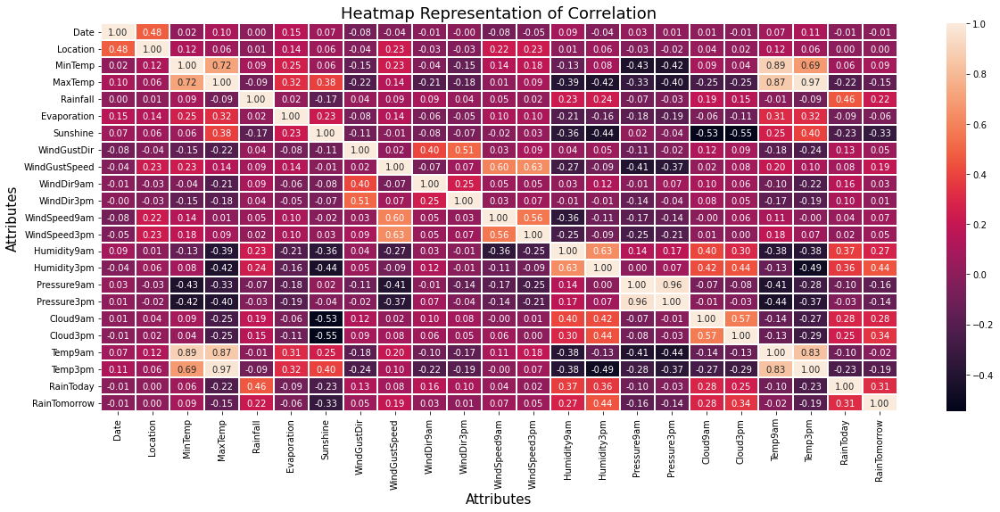

In [160]:
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(),annot=True,linewidth=0.2,linecolor='white',fmt='0.2f')
plt.xlabel('Attributes',fontsize=15)
plt.ylabel('Attributes',fontsize=15)
plt.title('Heatmap Representation of Correlation',fontsize=18)
plt.show()

### Multicollinearity

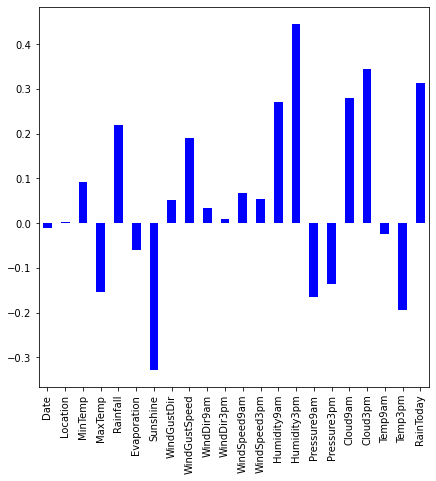

In [161]:
plt.figure(figsize=(7,7))
df.corr()['RainTomorrow'].drop(['RainTomorrow']).plot(kind='bar',color='blue')
plt.show()

### Will remove Multicollinearity later on

### Skewness

In [162]:
df.skew().sort_values()

Sunshine         -0.716525
Cloud9am         -0.366503
Cloud3pm         -0.276294
Humidity9am      -0.256743
WindDir3pm       -0.119847
MinTemp          -0.089989
Location         -0.050456
Pressure9am      -0.024082
Temp9am          -0.014748
Pressure3pm      -0.010214
Humidity3pm       0.118281
WindGustDir       0.119640
WindDir9am        0.172792
MaxTemp           0.380654
Date              0.386560
Temp3pm           0.397331
WindSpeed3pm      0.494217
WindGustSpeed     0.757000
WindSpeed9am      0.960591
RainTomorrow      1.241588
RainToday         1.242362
Rainfall         13.218403
Evaporation      14.023948
dtype: float64

### Skewness is present will remove in next part

### Outliers

In [163]:
z1=np.abs(zscore(df))
np.where(z1>3)

(array([  12,   12,   44,   44,   52,   52,   60,   60,   61,   61,   62,
          62,   62,   67,   68,   68,  123,  267,  296,  381,  381,  405,
         406,  407,  407,  431,  462,  563,  568,  568,  569,  602,  683,
         683,  699,  713,  748,  748,  770,  796,  797,  802,  928,  935,
         949,  979,  980,  980,  980, 1008, 1009, 1011, 1138, 1148, 1149,
        1151, 1189, 1202, 1203, 1237, 1241, 1264, 1265, 1357, 1411, 1412,
        1413, 1479, 1480, 1481, 1513, 1535, 1587, 1644, 1661, 1665, 1673,
        1680, 1774, 1819, 1873, 1898, 1903, 1945, 2016, 2028, 2043, 2063,
        2074, 2108, 2116, 2186, 2201, 2219, 2219, 2230, 2231, 2265, 2429,
        2488, 2500, 2505, 2527, 2527, 2541, 2593, 2676, 2677, 2735, 2827,
        2835, 2849, 2849, 2855, 2859, 2863, 2869, 2877, 2883, 2890, 2891,
        2897, 2898, 2900, 2901, 2905, 2909, 2911, 2919, 2925, 2933, 2939,
        2947, 2953, 2961, 2967, 2975, 2989, 3003, 3051, 3051, 3058, 3059,
        3059, 3060, 3066, 3067, 3067, 

### Data Cleansing
### Removing Multicollinearity

In [164]:
import statsmodels.api
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [165]:
x=df.drop(['RainTomorrow'],axis=1)
x

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,0,1,13.4,22.900000,0.6,5.389395,7.632205,13,44.000000,13,...,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0
1,1,1,7.4,25.100000,0.0,5.389395,7.632205,14,44.000000,6,...,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0
2,2,1,12.9,25.700000,0.0,5.389395,7.632205,15,46.000000,13,...,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0
3,3,1,9.2,28.000000,0.0,5.389395,7.632205,4,24.000000,9,...,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0
4,4,1,17.5,32.300000,1.0,5.389395,7.632205,13,41.000000,1,...,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2999,9,2.8,23.400000,0.0,5.389395,7.632205,0,31.000000,9,...,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0
8421,3000,9,3.6,25.300000,0.0,5.389395,7.632205,6,22.000000,9,...,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0
8422,3001,9,5.4,26.900000,0.0,5.389395,7.632205,3,37.000000,9,...,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0
8423,3002,9,7.8,27.000000,0.0,5.389395,7.632205,9,28.000000,10,...,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0


In [166]:
def vif():
    df5=pd.DataFrame()
    df5['Features']=x.columns
    df5['Variance_Inflation_Factor']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    print(df5)

In [167]:
vif()

         Features  Variance_Inflation_Factor
0            Date                   4.893556
1        Location                   6.641970
2         MinTemp                  58.043435
3         MaxTemp                 426.072409
4        Rainfall                   1.410755
5     Evaporation                   3.557236
6        Sunshine                  15.173789
7     WindGustDir                   5.304799
8   WindGustSpeed                  20.788671
9      WindDir9am                   4.726116
10     WindDir3pm                   6.024646
11   WindSpeed9am                   5.883336
12   WindSpeed3pm                   9.123542
13    Humidity9am                  69.463800
14    Humidity3pm                  48.838547
15    Pressure9am              515760.576978
16    Pressure3pm              514934.261955
17       Cloud9am                   8.705695
18       Cloud3pm                   8.807910
19        Temp9am                 189.650002
20        Temp3pm                 501.623457
21      Ra

Attributes (Pressure9am,Pressure3pm) & (Temp3pm,MaxTemp) are giving the same information to the target variable hence will drop those columns which have less correlation w.r.t. target variable

In [168]:
df6=df.drop(['Pressure9am','Temp3pm'],axis=1)
df6

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,RainTomorrow
0,0,1,13.4,22.900000,0.6,5.389395,7.632205,13,44.000000,13,...,20.0,24.0,71.0,22.0,1007.1,8.000000,4.503183,16.9,0,0
1,1,1,7.4,25.100000,0.0,5.389395,7.632205,14,44.000000,6,...,4.0,22.0,44.0,25.0,1007.8,4.566622,4.503183,17.2,0,0
2,2,1,12.9,25.700000,0.0,5.389395,7.632205,15,46.000000,13,...,19.0,26.0,38.0,30.0,1008.7,4.566622,2.000000,21.0,0,0
3,3,1,9.2,28.000000,0.0,5.389395,7.632205,4,24.000000,9,...,11.0,9.0,45.0,16.0,1012.8,4.566622,4.503183,18.1,0,0
4,4,1,17.5,32.300000,1.0,5.389395,7.632205,13,41.000000,1,...,7.0,20.0,82.0,33.0,1006.0,7.000000,8.000000,17.8,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2999,9,2.8,23.400000,0.0,5.389395,7.632205,0,31.000000,9,...,13.0,11.0,51.0,24.0,1020.3,4.566622,4.503183,10.1,0,0
8421,3000,9,3.6,25.300000,0.0,5.389395,7.632205,6,22.000000,9,...,13.0,9.0,56.0,21.0,1019.1,4.566622,4.503183,10.9,0,0
8422,3001,9,5.4,26.900000,0.0,5.389395,7.632205,3,37.000000,9,...,9.0,9.0,53.0,24.0,1016.8,4.566622,4.503183,12.5,0,0
8423,3002,9,7.8,27.000000,0.0,5.389395,7.632205,9,28.000000,10,...,13.0,7.0,51.0,24.0,1016.5,3.000000,2.000000,15.1,0,0


### Removing Outliers

In [169]:
df7=df6[(z1<3).all(axis=1)]
df7

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,RainTomorrow
0,0,1,13.4,22.900000,0.6,5.389395,7.632205,13,44.000000,13,...,20.0,24.0,71.0,22.0,1007.1,8.000000,4.503183,16.9,0,0
1,1,1,7.4,25.100000,0.0,5.389395,7.632205,14,44.000000,6,...,4.0,22.0,44.0,25.0,1007.8,4.566622,4.503183,17.2,0,0
2,2,1,12.9,25.700000,0.0,5.389395,7.632205,15,46.000000,13,...,19.0,26.0,38.0,30.0,1008.7,4.566622,2.000000,21.0,0,0
3,3,1,9.2,28.000000,0.0,5.389395,7.632205,4,24.000000,9,...,11.0,9.0,45.0,16.0,1012.8,4.566622,4.503183,18.1,0,0
4,4,1,17.5,32.300000,1.0,5.389395,7.632205,13,41.000000,1,...,7.0,20.0,82.0,33.0,1006.0,7.000000,8.000000,17.8,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2999,9,2.8,23.400000,0.0,5.389395,7.632205,0,31.000000,9,...,13.0,11.0,51.0,24.0,1020.3,4.566622,4.503183,10.1,0,0
8421,3000,9,3.6,25.300000,0.0,5.389395,7.632205,6,22.000000,9,...,13.0,9.0,56.0,21.0,1019.1,4.566622,4.503183,10.9,0,0
8422,3001,9,5.4,26.900000,0.0,5.389395,7.632205,3,37.000000,9,...,9.0,9.0,53.0,24.0,1016.8,4.566622,4.503183,12.5,0,0
8423,3002,9,7.8,27.000000,0.0,5.389395,7.632205,9,28.000000,10,...,13.0,7.0,51.0,24.0,1016.5,3.000000,2.000000,15.1,0,0


In [170]:
print(df6.shape)
print(df7.shape)

(8425, 21)
(7987, 21)


In [171]:
percentage_loss=(8425-7987)*100/8425
percentage_loss

5.198813056379822

I'm getting the percentage loss is about 5% which is decent because our dataset is large having 8425 rows and out of it we are loosing only 5% rows.Now we can move ahead by considering it

### Removing Skewness
### PowerTransformer

In [174]:
x=df7.drop('RainTomorrow',axis=1)
x

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday
0,0,1,13.4,22.900000,0.6,5.389395,7.632205,13,44.000000,13,14,20.0,24.0,71.0,22.0,1007.1,8.000000,4.503183,16.9,0
1,1,1,7.4,25.100000,0.0,5.389395,7.632205,14,44.000000,6,15,4.0,22.0,44.0,25.0,1007.8,4.566622,4.503183,17.2,0
2,2,1,12.9,25.700000,0.0,5.389395,7.632205,15,46.000000,13,15,19.0,26.0,38.0,30.0,1008.7,4.566622,2.000000,21.0,0
3,3,1,9.2,28.000000,0.0,5.389395,7.632205,4,24.000000,9,0,11.0,9.0,45.0,16.0,1012.8,4.566622,4.503183,18.1,0
4,4,1,17.5,32.300000,1.0,5.389395,7.632205,13,41.000000,1,7,7.0,20.0,82.0,33.0,1006.0,7.000000,8.000000,17.8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2999,9,2.8,23.400000,0.0,5.389395,7.632205,0,31.000000,9,1,13.0,11.0,51.0,24.0,1020.3,4.566622,4.503183,10.1,0
8421,3000,9,3.6,25.300000,0.0,5.389395,7.632205,6,22.000000,9,3,13.0,9.0,56.0,21.0,1019.1,4.566622,4.503183,10.9,0
8422,3001,9,5.4,26.900000,0.0,5.389395,7.632205,3,37.000000,9,14,9.0,9.0,53.0,24.0,1016.8,4.566622,4.503183,12.5,0
8423,3002,9,7.8,27.000000,0.0,5.389395,7.632205,9,28.000000,10,3,13.0,7.0,51.0,24.0,1016.5,3.000000,2.000000,15.1,0


In [173]:
pt=PowerTransformer(method='yeo-johnson')
x=pt.fit_transform(x)
x

array([[-2.47113848e+00, -1.56842088e+00,  6.05015740e-02, ...,
        -9.87238955e-04, -1.34269007e-01, -5.42475525e-01],
       [-2.44233565e+00, -1.56842088e+00, -1.05725282e+00, ...,
        -9.87238955e-04, -8.04446436e-02, -5.42475525e-01],
       [-2.42002633e+00, -1.56842088e+00, -3.22219600e-02, ...,
        -1.08215177e+00,  5.99608138e-01, -5.42475525e-01],
       ...,
       [ 1.66951372e+00,  1.01632853e+00, -1.43299533e+00, ...,
        -9.87238955e-04, -9.26387251e-01, -5.42475525e-01],
       [ 1.67023894e+00,  1.01632853e+00, -9.82333711e-01, ...,
        -1.08215177e+00, -4.57680773e-01, -5.42475525e-01],
       [ 1.67096405e+00,  1.01632853e+00,  3.38295674e-01, ...,
         1.55904423e+00, -4.75672549e-01, -5.42475525e-01]])

### Standard Scaler

In [175]:
x=df7.drop('RainTomorrow',axis=1)
x

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday
0,0,1,13.4,22.900000,0.6,5.389395,7.632205,13,44.000000,13,14,20.0,24.0,71.0,22.0,1007.1,8.000000,4.503183,16.9,0
1,1,1,7.4,25.100000,0.0,5.389395,7.632205,14,44.000000,6,15,4.0,22.0,44.0,25.0,1007.8,4.566622,4.503183,17.2,0
2,2,1,12.9,25.700000,0.0,5.389395,7.632205,15,46.000000,13,15,19.0,26.0,38.0,30.0,1008.7,4.566622,2.000000,21.0,0
3,3,1,9.2,28.000000,0.0,5.389395,7.632205,4,24.000000,9,0,11.0,9.0,45.0,16.0,1012.8,4.566622,4.503183,18.1,0
4,4,1,17.5,32.300000,1.0,5.389395,7.632205,13,41.000000,1,7,7.0,20.0,82.0,33.0,1006.0,7.000000,8.000000,17.8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2999,9,2.8,23.400000,0.0,5.389395,7.632205,0,31.000000,9,1,13.0,11.0,51.0,24.0,1020.3,4.566622,4.503183,10.1,0
8421,3000,9,3.6,25.300000,0.0,5.389395,7.632205,6,22.000000,9,3,13.0,9.0,56.0,21.0,1019.1,4.566622,4.503183,10.9,0
8422,3001,9,5.4,26.900000,0.0,5.389395,7.632205,3,37.000000,9,14,9.0,9.0,53.0,24.0,1016.8,4.566622,4.503183,12.5,0
8423,3002,9,7.8,27.000000,0.0,5.389395,7.632205,9,28.000000,10,3,13.0,7.0,51.0,24.0,1016.5,3.000000,2.000000,15.1,0


In [176]:
sc=StandardScaler()
x=sc.fit_transform(x)
x

array([[-1.51886155, -1.50842735,  0.05644354, ...,  0.01313815,
        -0.13809939, -0.54247553],
       [-1.51768225, -1.50842735, -1.05847646, ...,  0.01313815,
        -0.08425401, -0.54247553],
       [-1.51650296, -1.50842735, -0.03646646, ..., -1.07666074,
         0.59778751, -0.54247553],
       ...,
       [ 2.02020726,  1.02942282, -1.43011646, ...,  0.01313815,
        -0.92783168, -0.54247553],
       [ 2.02138656,  1.02942282, -0.98414846, ..., -1.07666074,
        -0.46117169, -0.54247553],
       [ 2.02256586,  1.02942282,  0.33517354, ...,  1.5355312 ,
        -0.47912015, -0.54247553]])

1.1625607200341791e-15
1.0


AxesSubplot(0.125,0.125;0.775x0.755)


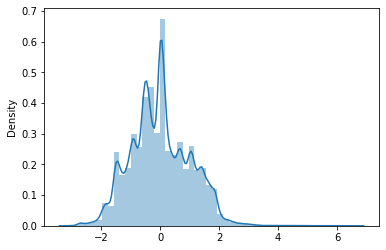

In [177]:
print(x.mean())
print(x.std())
print('\n')
print(sns.distplot(x))
plt.show()

Data is almost normally distributed

In [178]:
y=df7['RainTomorrow']
y

0       0
1       0
2       0
3       0
4       0
       ..
8420    0
8421    0
8422    0
8423    0
8424    0
Name: RainTomorrow, Length: 7987, dtype: int32

### Principle Component Analysis(PCA)

In [179]:
###reducing the feature into 5 principle components
pca=PCA(n_components=5)
x=pca.fit_transform(x)
x

array([[ 0.05116874,  0.59285313,  1.98955574, -2.37822507,  1.18571574],
       [ 0.61268443, -0.91724972,  1.87344562, -2.38794235,  1.17096345],
       [ 1.49621317, -0.01138089,  2.79022843, -2.90273181,  0.90430719],
       ...,
       [ 0.20565173, -1.60472444,  0.58785665,  1.13419032, -1.83882249],
       [ 0.88546617, -2.07828511,  0.1102366 ,  0.99440822, -1.86314338],
       [ 0.27344485,  0.35480171, -1.00625666,  2.77628173, -0.07156297]])

### Plotting the Relation b/w the Principle components

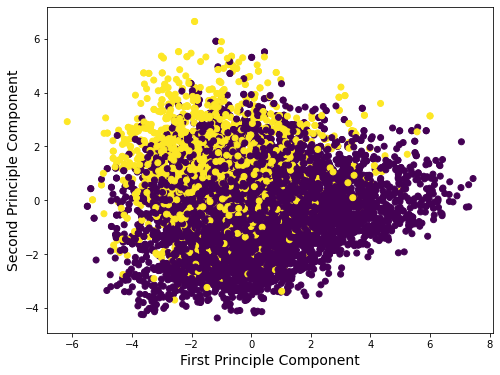

In [180]:
plt.figure(figsize=(8,6))
plt.scatter(x[:,0:1],x[:,1:2],c=y)
plt.xlabel('First Principle Component',fontsize=14)
plt.ylabel('Second Principle Component',fontsize=14)
plt.show()

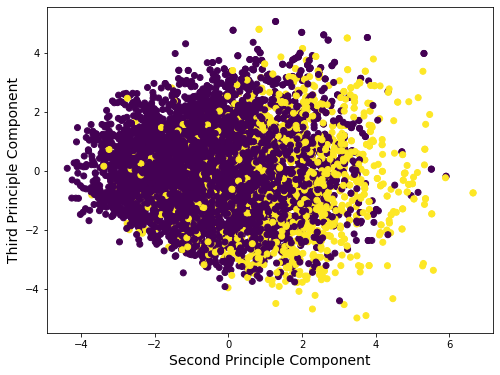

In [181]:
plt.figure(figsize=(8,6))
plt.scatter(x[:,1],x[:,2],c=y)
plt.xlabel('Second Principle Component',fontsize=14)
plt.ylabel('Third Principle Component',fontsize=14)
plt.show()

Above figures are showing that data are distributed well

### Using IMBLearn Technique for balancing the Target class

In [184]:
y.value_counts()

0    6165
1    1822
Name: RainTomorrow, dtype: int64

In [182]:
import pandas
import numpy
print('sklearn version',sklearn.__version__)
print('numpy version',numpy.__version__)
print('pandas version',pandas.__version__)

sklearn version 1.1.2
numpy version 1.20.3
pandas version 1.3.4


In [183]:
!pip install -U imbalanced-learn

In [185]:
from imblearn.over_sampling import SMOTE
sm=SMOTE()
x,y=sm.fit_resample(x,y)

In [186]:
y.value_counts()

0    6165
1    6165
Name: RainTomorrow, dtype: int64

In [187]:
print(x.shape)
print(y.shape)

(12330, 5)
(12330,)


### Training-Testing Phase
##### taking 20% for test and 80% for training

In [188]:
#importing machine learning libraries for Classification model
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
lr=LogisticRegression()

In [189]:
#finding out the best random_state 
for i in range(0,50):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
    lr.fit(x_train,y_train)
    pred_test=lr.predict(x_test)
    pred_train=lr.predict(x_train)
    if accuracy_score(pred_train,y_train)==accuracy_score(pred_test,y_test):
        print(f'At random_state-{i} The Logistic Regression Model performs really well')
        print(f'Training accuracy of the model is\t {accuracy_score(pred_train,y_train)}')
        print(f'Testing accuracy of the model is\t {accuracy_score(pred_test,y_test)}')
        print(f'Confusion Matrix for the model is\t {Confusion_matrix(pred_test,y_test)}')
        print(f'Classification Report for the model is\t {classification_report(pred_test,y_test)}')
        print('\n')
    else:
        print(f'At random_state-{i} The Training and Testing Accuracy of the model is different')
        print(f'Training accuracy of the model is\t {accuracy_score(pred_train,y_train)}')
        print(f'Testing accuracy of the model is\t {accuracy_score(pred_test,y_test)}')
        print(f'Confusion Matrix for the model is\n {confusion_matrix(pred_test,y_test)}')
        print(f'Classification Report for the model is\n {classification_report(pred_test,y_test)}')
        print('\n')             

At random_state-0 The Training and Testing Accuracy of the model is different
Training accuracy of the model is	 0.7383414436334145
Testing accuracy of the model is	 0.7453365774533658
Confusion Matrix for the model is
 [[934 318]
 [310 904]]
Classification Report for the model is
               precision    recall  f1-score   support

           0       0.75      0.75      0.75      1252
           1       0.74      0.74      0.74      1214

    accuracy                           0.75      2466
   macro avg       0.75      0.75      0.75      2466
weighted avg       0.75      0.75      0.75      2466



At random_state-1 The Training and Testing Accuracy of the model is different
Training accuracy of the model is	 0.7374290348742903
Testing accuracy of the model is	 0.7550689375506894
Confusion Matrix for the model is
 [[910 319]
 [285 952]]
Classification Report for the model is
               precision    recall  f1-score   support

           0       0.76      0.74      0.75      1

In [191]:
#choosing random_state as 0
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=0)
lr.fit(x_train,y_train)
pred_test=lr.predict(x_test)
pred_train=lr.predict(x_train)
print(f'At random_state-{0} The Training and Testing Accuracy of the model is almost same')
print(f'Training accuracy of the model is\t {accuracy_score(pred_train,y_train)}')
print(f'Testing accuracy of the model is\t {accuracy_score(pred_test,y_test)}')
print(f'Confusion Matrix for the model is\n {confusion_matrix(pred_test,y_test)}')
print(f'Classification Report for the model is\n {classification_report(pred_test,y_test)}')

At random_state-0 The Training and Testing Accuracy of the model is almost same
Training accuracy of the model is	 0.7383414436334145
Testing accuracy of the model is	 0.7453365774533658
Confusion Matrix for the model is
 [[934 318]
 [310 904]]
Classification Report for the model is
               precision    recall  f1-score   support

           0       0.75      0.75      0.75      1252
           1       0.74      0.74      0.74      1214

    accuracy                           0.75      2466
   macro avg       0.75      0.75      0.75      2466
weighted avg       0.75      0.75      0.75      2466



Logistic Regression model performs well but since training accuracy is more than testing accuracy hence there would be overfitting and due to this Bias will be on lower side and variance would be on higher side,also will check the cv score for each model going forward.
### Finding Out CV Score

In [192]:
from sklearn.model_selection import cross_val_score

In [193]:
for i in range(2,4):
    cvs=cross_val_score(lr,x,y,cv=i)
    mean=cvs.mean()
    std=cvs.std()
    print(f'At K-Fold {i} the CV Score of the logistic model is {mean} and standard deviation is {std}\n')

At K-Fold 2 the CV Score of the logistic model is 0.699837793998378 and standard deviation is 0.008191403081914017

At K-Fold 3 the CV Score of the logistic model is 0.7098134630981345 and standard deviation is 0.06623618073375838



we are getting good CV score as 70%,so we can say that CV score is helping the model in generalizing and make it perform better while doing the prediction.

In [194]:
#importing other models of classification
from sklearn.naive_bayes import GaussianNB,MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import roc_curve,roc_auc_score
gb=GaussianNB()
mb=MultinomialNB()
neighbor=KNeighborsClassifier()
dtc=DecisionTreeClassifier()
svm=SVC()
rfc=RandomForestClassifier()
ad=AdaBoostClassifier()
grd=GradientBoostingClassifier()
sgd=SGDClassifier()

In [195]:
#creating a definition to expand the model individually
def model(algorithm,x,y):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=0)
    algorithm.fit(x_train,y_train)
    pred_train_x=algorithm.predict(x_train)
    pred_test_y=algorithm.predict(x_test)
    print(f'For model {algorithm}')
    print('Training_Accuracy_Score=',accuracy_score(y_train,pred_train_x))
    print('Testing_Accuracy_Score=',accuracy_score(y_test,pred_test_y))
    print('\n Classification Report-\n',classification_report(y_test,pred_test_y))
    print('\n Confusion Metrix-\n',confusion_matrix(y_test,pred_test_y))
    print('\n\nAUC_ROC CURVE')
    prob=algorithm.predict_proba(x_test)[:,1]
    FPR,TPR,THRESHOLD=roc_curve(y_test,prob)
    plt.plot(FPR,TPR)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC_Curve for the model {algorithm}')
    plt.show()
    ROC_AUC_SCORE=roc_auc_score(y_test,pred_test_y)
    print('ROC AUC SCORE is-',ROC_AUC_SCORE)
    print('\n')
    print('Finding out the best K-Fold Value')
    print('\n\t')
    for l in range(2,4):
        cvscore=cross_val_score(algorithm,x,y,cv=l)
        cv_accuracy_score=cvscore.mean()
        print(f'At the K-Fold {l} the CV score of model {algorithm} is {cv_accuracy_score}')
        print('\n')

For model LogisticRegression()
Training_Accuracy_Score= 0.7383414436334145
Testing_Accuracy_Score= 0.7453365774533658

 Classification Report-
               precision    recall  f1-score   support

           0       0.75      0.75      0.75      1244
           1       0.74      0.74      0.74      1222

    accuracy                           0.75      2466
   macro avg       0.75      0.75      0.75      2466
weighted avg       0.75      0.75      0.75      2466


 Confusion Metrix-
 [[934 310]
 [318 904]]


AUC_ROC CURVE


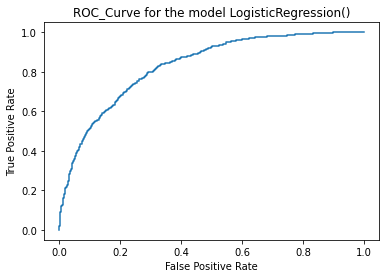

ROC AUC SCORE is- 0.7452873629756709


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model LogisticRegression() is 0.699837793998378


At the K-Fold 3 the CV score of model LogisticRegression() is 0.7098134630981345




In [196]:
model(lr,x,y)

For model GaussianNB()
Training_Accuracy_Score= 0.7340835360908353
Testing_Accuracy_Score= 0.7453365774533658

 Classification Report-
               precision    recall  f1-score   support

           0       0.74      0.75      0.75      1244
           1       0.75      0.74      0.74      1222

    accuracy                           0.75      2466
   macro avg       0.75      0.75      0.75      2466
weighted avg       0.75      0.75      0.75      2466


 Confusion Metrix-
 [[939 305]
 [323 899]]


AUC_ROC CURVE


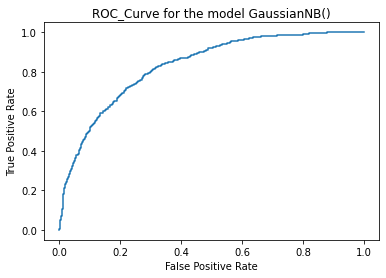

ROC AUC SCORE is- 0.7452511827640104


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model GaussianNB() is 0.7079480940794809


At the K-Fold 3 the CV score of model GaussianNB() is 0.7128142741281427




In [197]:
model(gb,x,y)

For model KNeighborsClassifier()
Training_Accuracy_Score= 0.8971005677210057
Testing_Accuracy_Score= 0.8564476885644768

 Classification Report-
               precision    recall  f1-score   support

           0       0.94      0.77      0.84      1244
           1       0.80      0.95      0.87      1222

    accuracy                           0.86      2466
   macro avg       0.87      0.86      0.86      2466
weighted avg       0.87      0.86      0.86      2466


 Confusion Metrix-
 [[ 953  291]
 [  63 1159]]


AUC_ROC CURVE


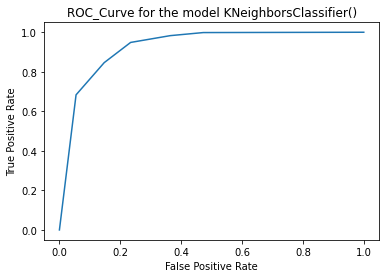

ROC AUC SCORE is- 0.8572611711337169


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model KNeighborsClassifier() is 0.6789943227899433


At the K-Fold 3 the CV score of model KNeighborsClassifier() is 0.7148418491484185




In [198]:
model(neighbor,x,y)

For model DecisionTreeClassifier()
Training_Accuracy_Score= 1.0
Testing_Accuracy_Score= 0.8605028386050284

 Classification Report-
               precision    recall  f1-score   support

           0       0.87      0.85      0.86      1244
           1       0.85      0.87      0.86      1222

    accuracy                           0.86      2466
   macro avg       0.86      0.86      0.86      2466
weighted avg       0.86      0.86      0.86      2466


 Confusion Metrix-
 [[1055  189]
 [ 155 1067]]


AUC_ROC CURVE


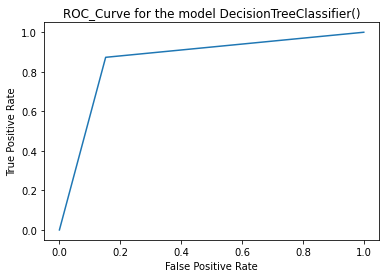

ROC AUC SCORE is- 0.8606147478436594


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model DecisionTreeClassifier() is 0.6853203568532036


At the K-Fold 3 the CV score of model DecisionTreeClassifier() is 0.724655312246553




In [199]:
model(dtc,x,y)

For model RandomForestClassifier()
Training_Accuracy_Score= 1.0
Testing_Accuracy_Score= 0.9071370640713706

 Classification Report-
               precision    recall  f1-score   support

           0       0.93      0.89      0.91      1244
           1       0.89      0.93      0.91      1222

    accuracy                           0.91      2466
   macro avg       0.91      0.91      0.91      2466
weighted avg       0.91      0.91      0.91      2466


 Confusion Metrix-
 [[1103  141]
 [  88 1134]]


AUC_ROC CURVE


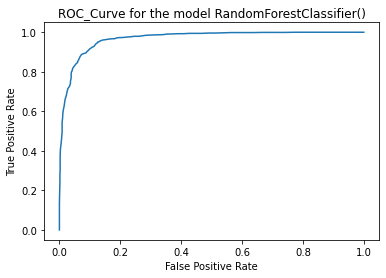

ROC AUC SCORE is- 0.9073214276316828


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model RandomForestClassifier() is 0.716139497161395


At the K-Fold 3 the CV score of model RandomForestClassifier() is 0.756447688564477




In [200]:
model(rfc,x,y)

For model AdaBoostClassifier()
Training_Accuracy_Score= 0.7463503649635036
Testing_Accuracy_Score= 0.7550689375506894

 Classification Report-
               precision    recall  f1-score   support

           0       0.76      0.75      0.76      1244
           1       0.75      0.76      0.75      1222

    accuracy                           0.76      2466
   macro avg       0.76      0.76      0.76      2466
weighted avg       0.76      0.76      0.76      2466


 Confusion Metrix-
 [[936 308]
 [296 926]]


AUC_ROC CURVE


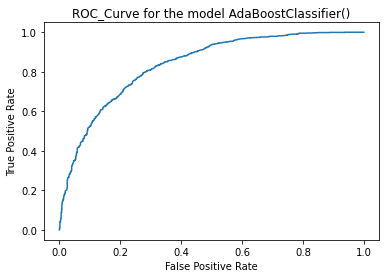

ROC AUC SCORE is- 0.7550928581577826


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model AdaBoostClassifier() is 0.6713706407137063


At the K-Fold 3 the CV score of model AdaBoostClassifier() is 0.6952149229521494




In [201]:
model(ad,x,y)

For model GradientBoostingClassifier()
Training_Accuracy_Score= 0.777676399026764
Testing_Accuracy_Score= 0.7725060827250608

 Classification Report-
               precision    recall  f1-score   support

           0       0.78      0.77      0.77      1244
           1       0.77      0.77      0.77      1222

    accuracy                           0.77      2466
   macro avg       0.77      0.77      0.77      2466
weighted avg       0.77      0.77      0.77      2466


 Confusion Metrix-
 [[959 285]
 [276 946]]


AUC_ROC CURVE


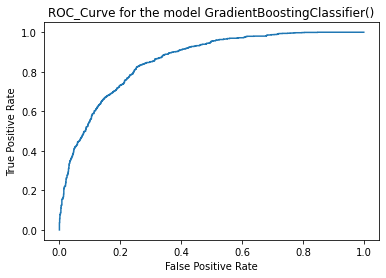

ROC AUC SCORE is- 0.7725205372037828


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model GradientBoostingClassifier() is 0.6670721816707218


At the K-Fold 3 the CV score of model GradientBoostingClassifier() is 0.6858880778588808




In [202]:
model(grd,x,y)

### Hyper Parameter Tuning
##### To make the model more accurate by providing their best parameters

In [203]:
from sklearn.model_selection import GridSearchCV

In [204]:
#defining all the parameters of the respective models
Parameter_neighbor={'weights':['uniform', 'distance'],'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute']}
Parameter_dtc={'criterion':["gini", "entropy", "log_loss"],'splitter':["best", "random"],'max_features':["auto", "sqrt", "log2"]}
Parameter_rfc={'criterion' : ["gini", "entropy", "log_loss"],'max_features':["sqrt", "log2", None],'class_weight':["balanced", "balanced_subsample"]}
Parameter_ad={'algorithm':['SAMME', 'SAMME.R']}
Parameter_grd={'loss':['log_loss', 'deviance', 'exponential'],'criterion':['friedman_mse', 'squared_error', 'mse'],'max_features':['auto', 'sqrt', 'log2']}

In [205]:
#Now I'm defining a function so that i can individuallay let the model perfom and give the best parameter out of it.
def HPT(machine,dictionary):
    gd=GridSearchCV(machine,dictionary)
    gd.fit(x,y)
    print(f'The best Parameters of the model {machine} is {gd.best_params_}')

In [206]:
HPT(neighbor,Parameter_neighbor)

The best Parameters of the model KNeighborsClassifier() is {'algorithm': 'auto', 'weights': 'distance'}


In [207]:
HPT(dtc,Parameter_dtc)

The best Parameters of the model DecisionTreeClassifier() is {'criterion': 'log_loss', 'max_features': 'sqrt', 'splitter': 'random'}


In [208]:
HPT(rfc,Parameter_rfc)

The best Parameters of the model RandomForestClassifier() is {'class_weight': 'balanced_subsample', 'criterion': 'entropy', 'max_features': 'sqrt'}


In [209]:
HPT(ad,Parameter_ad)

The best Parameters of the model AdaBoostClassifier() is {'algorithm': 'SAMME'}


In [210]:
HPT(grd,Parameter_grd)

The best Parameters of the model GradientBoostingClassifier() is {'criterion': 'squared_error', 'loss': 'exponential', 'max_features': 'log2'}


In [211]:
#Redefining the models after getting the parameters
lr=LogisticRegression()
gb=GaussianNB()
neighbor=KNeighborsClassifier(algorithm='auto',weights='distance')
dtc=DecisionTreeClassifier(criterion='log_loss',max_features='sqrt',splitter='random')
rfc=RandomForestClassifier(class_weight= 'balanced_subsample',criterion='entropy',max_features='sqrt')
ad=AdaBoostClassifier(algorithm= 'SAMME')
grd=GradientBoostingClassifier(criterion='squared_error',loss= 'exponential',max_features= 'log2')

For model LogisticRegression()
Training_Accuracy_Score= 0.7383414436334145
Testing_Accuracy_Score= 0.7453365774533658

 Classification Report-
               precision    recall  f1-score   support

           0       0.75      0.75      0.75      1244
           1       0.74      0.74      0.74      1222

    accuracy                           0.75      2466
   macro avg       0.75      0.75      0.75      2466
weighted avg       0.75      0.75      0.75      2466


 Confusion Metrix-
 [[934 310]
 [318 904]]


AUC_ROC CURVE


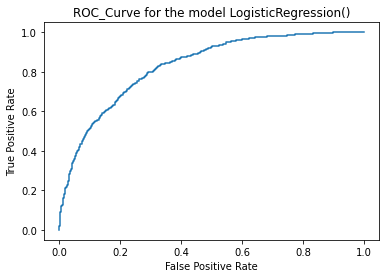

ROC AUC SCORE is- 0.7452873629756709


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model LogisticRegression() is 0.699837793998378


At the K-Fold 3 the CV score of model LogisticRegression() is 0.7098134630981345




In [212]:
model(lr,x,y)

For model GaussianNB()
Training_Accuracy_Score= 0.7340835360908353
Testing_Accuracy_Score= 0.7453365774533658

 Classification Report-
               precision    recall  f1-score   support

           0       0.74      0.75      0.75      1244
           1       0.75      0.74      0.74      1222

    accuracy                           0.75      2466
   macro avg       0.75      0.75      0.75      2466
weighted avg       0.75      0.75      0.75      2466


 Confusion Metrix-
 [[939 305]
 [323 899]]


AUC_ROC CURVE


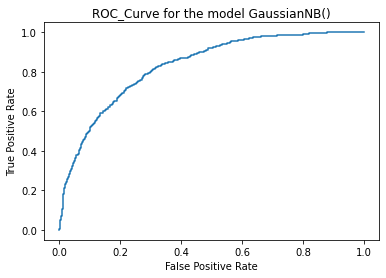

ROC AUC SCORE is- 0.7452511827640104


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model GaussianNB() is 0.7079480940794809


At the K-Fold 3 the CV score of model GaussianNB() is 0.7128142741281427




In [213]:
model(gb,x,y)

For model KNeighborsClassifier(weights='distance')
Training_Accuracy_Score= 1.0
Testing_Accuracy_Score= 0.902676399026764

 Classification Report-
               precision    recall  f1-score   support

           0       0.96      0.84      0.90      1244
           1       0.85      0.97      0.91      1222

    accuracy                           0.90      2466
   macro avg       0.91      0.90      0.90      2466
weighted avg       0.91      0.90      0.90      2466


 Confusion Metrix-
 [[1043  201]
 [  39 1183]]


AUC_ROC CURVE


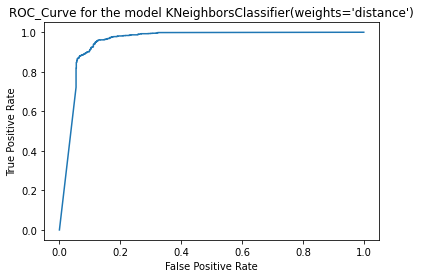

ROC AUC SCORE is- 0.903254771841007


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model KNeighborsClassifier(weights='distance') is 0.7051094890510949


At the K-Fold 3 the CV score of model KNeighborsClassifier(weights='distance') is 0.7445255474452553




In [214]:
model(neighbor,x,y)

For model DecisionTreeClassifier(criterion='log_loss', max_features='sqrt',
                       splitter='random')
Training_Accuracy_Score= 1.0
Testing_Accuracy_Score= 0.8576642335766423

 Classification Report-
               precision    recall  f1-score   support

           0       0.87      0.84      0.86      1244
           1       0.84      0.87      0.86      1222

    accuracy                           0.86      2466
   macro avg       0.86      0.86      0.86      2466
weighted avg       0.86      0.86      0.86      2466


 Confusion Metrix-
 [[1046  198]
 [ 153 1069]]


AUC_ROC CURVE


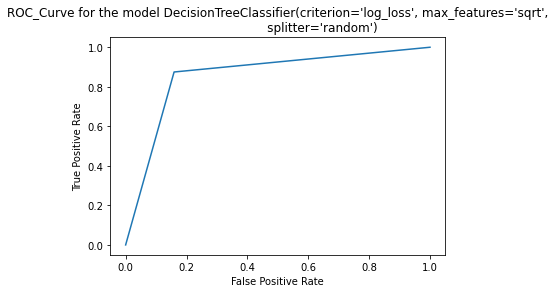

ROC AUC SCORE is- 0.8578157151051725


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model DecisionTreeClassifier(criterion='log_loss', max_features='sqrt',
                       splitter='random') is 0.700081103000811


At the K-Fold 3 the CV score of model DecisionTreeClassifier(criterion='log_loss', max_features='sqrt',
                       splitter='random') is 0.726845093268451




In [215]:
model(dtc,x,y)

For model RandomForestClassifier(class_weight='balanced_subsample', criterion='entropy')
Training_Accuracy_Score= 1.0
Testing_Accuracy_Score= 0.9180859691808597

 Classification Report-
               precision    recall  f1-score   support

           0       0.93      0.90      0.92      1244
           1       0.90      0.94      0.92      1222

    accuracy                           0.92      2466
   macro avg       0.92      0.92      0.92      2466
weighted avg       0.92      0.92      0.92      2466


 Confusion Metrix-
 [[1121  123]
 [  79 1143]]


AUC_ROC CURVE


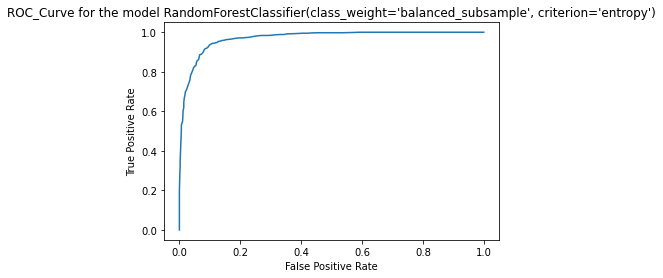

ROC AUC SCORE is- 0.9182386420448266


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model RandomForestClassifier(class_weight='balanced_subsample', criterion='entropy') is 0.7177615571776156


At the K-Fold 3 the CV score of model RandomForestClassifier(class_weight='balanced_subsample', criterion='entropy') is 0.7603406326034063




In [216]:
model(rfc,x,y)

For model AdaBoostClassifier(algorithm='SAMME')
Training_Accuracy_Score= 0.7380373073803731
Testing_Accuracy_Score= 0.7469586374695864

 Classification Report-
               precision    recall  f1-score   support

           0       0.75      0.75      0.75      1244
           1       0.74      0.75      0.75      1222

    accuracy                           0.75      2466
   macro avg       0.75      0.75      0.75      2466
weighted avg       0.75      0.75      0.75      2466


 Confusion Metrix-
 [[930 314]
 [310 912]]


AUC_ROC CURVE


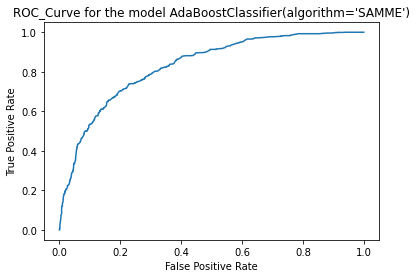

ROC AUC SCORE is- 0.746952968356129


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model AdaBoostClassifier(algorithm='SAMME') is 0.672830494728305


At the K-Fold 3 the CV score of model AdaBoostClassifier(algorithm='SAMME') is 0.6992700729927007




In [217]:
model(ad,x,y)

For model GradientBoostingClassifier(criterion='squared_error', loss='exponential',
                           max_features='log2')
Training_Accuracy_Score= 0.7706812652068127
Testing_Accuracy_Score= 0.7696674776966748

 Classification Report-
               precision    recall  f1-score   support

           0       0.77      0.77      0.77      1244
           1       0.77      0.77      0.77      1222

    accuracy                           0.77      2466
   macro avg       0.77      0.77      0.77      2466
weighted avg       0.77      0.77      0.77      2466


 Confusion Metrix-
 [[955 289]
 [279 943]]


AUC_ROC CURVE


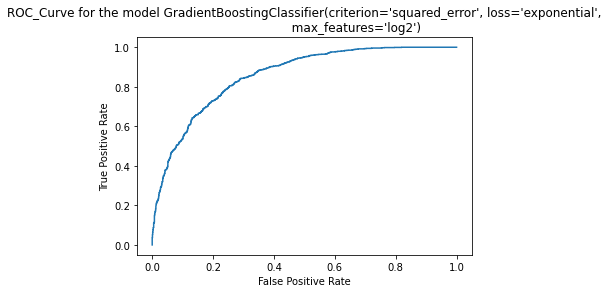

ROC AUC SCORE is- 0.769685324253635


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model GradientBoostingClassifier(criterion='squared_error', loss='exponential',
                           max_features='log2') is 0.6738037307380373


At the K-Fold 3 the CV score of model GradientBoostingClassifier(criterion='squared_error', loss='exponential',
                           max_features='log2') is 0.689375506893755




In [218]:
model(grd,x,y)

###### After applying the best parameters on each models i must say that RandomForestClassifier model performs really well in predicting the Rain_Tomorrow variable.Though target was having 2 classes and model gives us training accuracy score as 100% and testing accuracy score as 92%. Also the CV score which is 92%, is getting increased everytime when i'm increasing the fold numbers.Also the ROC_AUC_SCORE is 0.92 it means model is predicting the right output 92 times out of 100. Hence i'll consider this model as best one for predicting the target.

### Saving the Best Modle

In [219]:
import joblib

In [220]:
File='Rain_tomorrow.obj'
joblib.dump(rfc,File)

['Rain_tomorrow.obj']

### Loading the Model

In [221]:
b=joblib.load('Rain_tomorrow.obj')
b

RandomForestClassifier(class_weight='balanced_subsample', criterion='entropy')

In [222]:
#making prediction
pred=b.predict(x_test)
pred

array([1, 1, 1, ..., 1, 1, 0])

In [223]:
#Testing Accuracy of RandomForestClassifier Model
Accuracy_score=(accuracy_score(pred,y_test))*100
Accuracy_score

91.80859691808597


The ROC AUC Score is= 0.9182386420448266


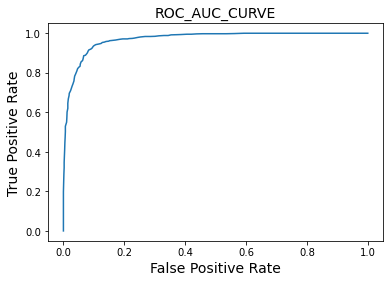

In [224]:
prob=b.predict_proba(x_test)[:,1]
FPR,TPR,THRESHOLD=roc_curve(y_test,prob)
plt.plot(FPR,TPR)
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)
plt.title('ROC_AUC_CURVE',fontsize=14)
print(f'\nThe ROC AUC Score is= {roc_auc_score(y_test,pred)}')

In [225]:
conclusion=pd.DataFrame(data=([pred,y_test]),index=['Predicted RainTomorrow','Original RainTomorrow'])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,2456,2457,2458,2459,2460,2461,2462,2463,2464,2465
Predicted RainTomorrow,1,1,1,1,0,1,0,0,0,1,...,1,1,0,1,1,1,1,1,1,0
Original RainTomorrow,1,1,1,1,0,1,0,0,0,1,...,1,1,0,1,1,1,1,1,1,0


##### When I deployed our RandomForestClassifier model to the y_test data what i found is that the testing accuracy of the model went to 92% which is excellent accuracy for predicting any target variable correctly.Also the ROC AUC Score is 0.92 which is greater than 0.6 of threshold value and it indicates that out of 100 times,92 times model is predicting the right classes and it is still a great accuracy. As we can see in the conclusion portion we have got almost same value in prediction column as compare to original RainTomorrow column. So we can say that this model has great accuracy in predicting the income